In [96]:
# Os packages
import json
from pathlib import Path

# Environmental variables
from dotenv import dotenv_values

# Data handling
import numpy as np
import pandas as pd

# Type hinting
from typing import Dict, List, Union, Tuple, Any, Optional, Type
from sklearn.base import BaseEstimator
from numpy.typing import ArrayLike

# Visualization
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# Progress Bar
from tqdm.auto import tqdm

# Feature Processing
from sklearn.base import clone
from sklearn.utils import resample
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import recall_score, precision_score
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.feature_selection import mutual_info_classif, SelectKBest  # Univariate Selection using KBest

# Balance class distribution
from imblearn.pipeline import Pipeline as imPipeline
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

# Modelling
import optuna
from optuna.samplers import TPESampler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# import lightgbm as lgb
# from sklearn import svm


# Explainer
import shap

# Save model
import joblib

# Evaluation - Cross Validation & Hyperparameters Fine-tuning
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

# Utils
from utils.paths import path_maker
from utils.cleaning import MissingHandler
from utils.visualisation import show_plot, show_plots


# Disable warnings
import warnings
warnings.filterwarnings("ignore") # default

# Set pandas to display all columns
pd.set_option("display.max_columns", None)

# Suppress the scientific notation
pd.set_option("display.float_format", lambda x: "%.2f" % x)

# Set default renderer for plotly
pio.renderers.default = "vscode+colab+plotly_mimetype+png" # Set default renderers for plotly
INTERACTIVE = False  # False, Display on plots as webp and render to display, works on GitHub. Set to True to use interactive plots in supported environments
COLOR_DISCRETE_SEQUENCE = [px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[3]] # red, green, blue, purple
COLOR_CONTINUOUS_SEQUENCE = px.colors.sequential.Viridis
SKIP = False  # Global flag to skip plot saving and displaying

print("🛬 Imported all packages.", "Warnings hidden. 👻")

🛬 Imported all packages. Warnings hidden. 👻


## 2.2 Data reading
### 2.2.1 Path & Constants

In [2]:
eda_artifacts_filepath = Path("../artifacts/eda/eda_artifacts.joblib")

# Load artifacts with joblib
eda_artifacts = joblib.load(eda_artifacts_filepath)
eda_artifacts.keys()

dict_keys(['col_map', 'numerical_cols', 'categorical_cols', 'bool_cols', 'target_col', 'paths'])

In [3]:
# Load preprocessing artifacts  
preprocessing_artifacts_filepath = Path("../artifacts/preprocessing/preprocessing_artifacts.joblib")

# Load artifacts with joblib
preprocessing_artifacts = joblib.load(preprocessing_artifacts_filepath)
print("🛬 Loaded preprocessing artifacts from:", preprocessing_artifacts_filepath)

🛬 Loaded preprocessing artifacts from: ..\artifacts\preprocessing\preprocessing_artifacts.joblib


In [4]:
preprocessing_artifacts.keys()

dict_keys(['feature_creation_pipeline', 'preprocessor', 'col_map', 'numerical_cols', 'categorical_cols', 'bool_cols', 'target_col', 'RANDOM_STATE'])

In [5]:
BASE_DIR = eda_artifacts["paths"]["BASE_DIR"]
ENV_FILE = eda_artifacts["paths"]["ENV_FILE"]
DATASET_DIR = eda_artifacts["paths"]["DATASET_DIR"]
RAW_DIR = eda_artifacts["paths"]["RAW_DIR"]
TRAIN_TEST = eda_artifacts["paths"]["TRAIN_TEST"]
PREPROCESSED_DIR = eda_artifacts["paths"]["PROCESSED_DIR"]
TRAIN_TEST_PROCESSED = eda_artifacts["paths"]["TRAIN_TEST_PROCESSED"]
PLOTS = eda_artifacts["paths"]["PLOTS"]
SAVE_MODELS = eda_artifacts["paths"]["SAVE_MODELS"]

In [6]:
feature_creation_pipeline = preprocessing_artifacts["feature_creation_pipeline"]
preprocessor = preprocessing_artifacts["preprocessor"]
col_map = preprocessing_artifacts["col_map"]
numerical_cols = preprocessing_artifacts["numerical_cols"]
categorical_cols = preprocessing_artifacts["categorical_cols"]
bool_cols = preprocessing_artifacts["bool_cols"]
target_col = preprocessing_artifacts["target_col"]
RANDOM_STATE = preprocessing_artifacts["RANDOM_STATE"]

### 2.2.2 Environment variables & Other constants


In [7]:
# Load environment variables from .env file into a dictionary
environment_variables = dotenv_values(ENV_FILE)
# Get the hugginface token file path that you set in the '.env' file
TOKEN_FILE = environment_variables.get("TOKEN_FILE")

## 4.0 Modelling & Evaluation 💡


**ML Models**

1. LogisticRegression
2. RandomForestClassifier
3. DecisionClassifier
4. XGBClassifier

- Load train, eval, test datasets

In [8]:
X_train = pd.read_parquet(path_maker("X_train.parquet", PREPROCESSED_DIR))
X_eval = pd.read_parquet(path_maker("X_eval.parquet", PREPROCESSED_DIR))
X_test = pd.read_parquet(path_maker("X_test.parquet", PREPROCESSED_DIR))   

y_train = pd.read_parquet(path_maker("y_train.parquet", PREPROCESSED_DIR))
y_eval = pd.read_parquet(path_maker("y_eval.parquet", PREPROCESSED_DIR))
y_test = pd.read_parquet(path_maker("y_test.parquet", PREPROCESSED_DIR)) 

In [9]:
# Ensure the dimensions match
assert X_train.shape[1] == X_eval.shape[1], "Number of features doesn't match"
assert X_train.shape[1] == X_test.shape[1], "Number of features doesn't match"

- Create a models list

In [10]:
N_JOBS = -1
VERBOSE = 0
METRIC = "recall"

# Define the list of models to evaluate
models = [
    LogisticRegression(random_state=RANDOM_STATE, verbose=VERBOSE),
    RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS, verbose=VERBOSE),
    DecisionTreeClassifier(random_state=RANDOM_STATE),
    # svm.SVC(random_state=RANDOM_STATE, probability=True),
    XGBClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS, verbose=VERBOSE),
    # lgb.LGBMClassifier(random_state=RANDOM_STATE, verbose=-1)
]

In [11]:
def find_threshold_with_constraints(
    y_true,
    y_proba,
    min_recall=0.70,
    min_precision=0.50
):
    """
    Clinically optimized threshold selection using:
    - PR curve geometry
    - Pareto frontier filtering
    - Clinical constraints
    - F1 fallback
    """
    from sklearn.metrics import precision_recall_curve, f1_score
    import numpy as np

    precisions, recalls, thresholds = precision_recall_curve(y_true, y_proba)

    # Remove last threshold (sklearn quirk)
    thresholds = np.append(thresholds, 1.0)

    # Build table
    table = np.vstack([thresholds, precisions, recalls]).T

    # Pareto frontier: keep only thresholds not dominated by others
    pareto = []
    for t, p, r in table:
        if not any((p2 >= p and r2 >= r) and (p2 > p or r2 > r)
                   for _, p2, r2 in table):
            pareto.append((t, p, r))

    pareto = np.array(pareto)

    # Apply clinical constraints
    valid = pareto[(pareto[:,1] >= min_precision) & (pareto[:,2] >= min_recall)]

    if len(valid) > 0:
        # Choose threshold with highest recall (or highest precision)
        best = valid[np.argmax(valid[:,2])]
        return best[0]

    # Fallback: best F1
    f1_scores = [f1_score(y_true, (y_proba >= t).astype(int)) for t in thresholds]
    return thresholds[np.argmax(f1_scores)]

In [12]:
# --- Determine Fibonacci k-values based on dataset dimensionality ---
def get_n_features(
    preprocessor: ColumnTransformer,
    feature_creation_pipeline: Pipeline,
    X_train: pd.DataFrame
) -> int:
    """
    Fit-transforms the feature creation pipeline and preprocessor,
    then returns the number of resulting features.
    """
    # clone pipelines to avoid fitting them in-place
    feature_creation_pipeline: Pipeline = clone(feature_creation_pipeline)
    preprocessor: ColumnTransformer = clone(preprocessor)
    X_created = feature_creation_pipeline.fit_transform(X_train)
    X_processed = preprocessor.fit_transform(X_created)
    return X_processed.shape[1]

n_features = get_n_features(preprocessor, feature_creation_pipeline, X_train)

In [13]:
n_features

30

In [14]:
# ---------------------------------------------------------
# Class Imbalance Handling
# ---------------------------------------------------------
resampler_space = [
    "passthrough",
    SMOTE(random_state=RANDOM_STATE),
    SMOTETomek(random_state=RANDOM_STATE),
    RandomOverSampler(random_state=RANDOM_STATE),
    RandomUnderSampler(random_state=RANDOM_STATE),
]

# Class weight is directly in supported models

In [15]:
# Compute class imbalance ratio for PIMA
n_pos = (y_train==1).sum().iloc[0]
n_neg = (y_train==0).sum().iloc[0]
scale_ratio = n_neg / n_pos
scale_ratio

np.float64(1.8716577540106951)

In [16]:
param_grids = {
    "LogisticRegression": {
        "classifier__C": [0.01, 0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"],
        "classifier__max_iter": [1000],
        "classifier__class_weight": [None, "balanced"], # sampler
        # Resampler
        "resampler": resampler_space,
        # Feature selector hyperparameters all, 60%, 80% of features for linear models
        "feature_selector__k": ["all", int(0.6 * n_features), int(0.8 * n_features)],
    },
    "RandomForestClassifier": {
        "classifier__n_estimators": [400, 600, 800],            # more trees for stability
        "classifier__max_depth": [None, 6, 8, 10],              # allow full depth but not too deep
        "classifier__min_samples_split": [2, 3, 4, 5],          # small splits to use all features
        "classifier__min_samples_leaf": [1, 2, 3],              # keep leaves small to detect positives
        "classifier__max_features": ["sqrt", "log2", None],     
        "classifier__class_weight": [
            None, 
            "balanced", 
            {0:1, 1:2}, 
            {0:1, 1:3}, 
            {0:1, 1:4}  # boost minority class
        ],
            # Resampler
        "resampler": resampler_space,
        # Feature selector hyperparameters # Tree based models already know how to discover signals on their own classifier__max_features
        "feature_selector__k": ['all']
    },
    "DecisionTreeClassifier": {
        "classifier__max_depth": [None, 4, 5, 6],        # allow full depth but not too deep
        "classifier__min_samples_split": [2, 3, 5],      # small splits to use more features
        "classifier__min_samples_leaf": [1, 2],          # keep leaves small to catch positives
        "classifier__class_weight": [None, "balanced"],  # handle class imbalance
        "classifier__max_features": ["sqrt", "log2", None],     
        "classifier__ccp_alpha": [0.0, 1e-4, 5e-4],      # minimal pruning, don't remove features
        # Resampler
        "resampler": resampler_space,
        # Feature selector hyperparameters
        "feature_selector__k": ['all'],
    },
    "XGBClassifier": {
        "classifier__n_estimators": [400, 600, 800],
        "classifier__max_depth": [4, 5, 6],
        "classifier__learning_rate": [0.03, 0.05, 0.1],
        "classifier__subsample": [0.8, 0.9],
        "classifier__colsample_bytree": [0.8, 0.9],
        "classifier__scale_pos_weight": [1.0, scale_ratio, 2.5],
        "classifier__min_child_weight": [1, 2],
        "classifier__gamma": [0, 0.1],
        # Resampler
        "resampler": resampler_space,
        # Feature selector hyperparameters
        "feature_selector__k": ['all'],
    },
}

param_grids = {
    k: v
    for k, v in param_grids.items()
    if any(model.__class__.__name__ == k for model in models)
}

param_grids.keys()

dict_keys(['LogisticRegression', 'RandomForestClassifier', 'DecisionTreeClassifier', 'XGBClassifier'])

In [18]:
def evaluate_models(
    models: List,
    param_grids: Dict[str, Dict[str, List]],
    feature_creation_pipeline: Optional[Pipeline],
    preprocessor: Optional[Pipeline],
    X_train: pd.DataFrame,
    y_train_encoded,
    X_eval: pd.DataFrame,
    y_eval_encoded,
    X_test: Optional[pd.DataFrame] = None,
    y_test: Optional[ArrayLike] = None,
    target_class: Optional[List[str]] = None,
    imbalance_strategy: bool = True,
    threshold_value: Optional[float] = None,
    create_features: bool = False,
    col_map: Optional[Dict[str, str]] = None,
    random_state: int = 2026,
    interactive: bool = False,
    verbose: bool = True,
    n_trials: int = 50
) -> Tuple[
    pd.DataFrame,                  # eval metrics
    Dict[str, Pipeline],           # trained models
    Dict[str, go.Figure],          # eval confusion matrices
    go.Figure,                     # model leaderboard
    go.Figure,                     # resampler leaderboard
    Optional[pd.DataFrame],        # test metrics
    Optional[Dict[str, go.Figure]] # test confusion matrices
]:

    # ---------------------------------------------------------
    # Setup
    # ---------------------------------------------------------
    feature_creator = (
        feature_creation_pipeline.named_steps["feature_creator"]
        if feature_creation_pipeline else None
    )
    if target_class is None:
        target_class = list(np.unique(y_eval_encoded))

    trained_models: Dict[str, Pipeline] = {}
    cm_figs: Dict[str, go.Figure] = {}
    metrics_table = pd.DataFrame(
        columns=["model_name", "resampler_strategy", "threshold", "recall", "precision", "f1_score", "accuracy"]
    )

    # Optional test evaluation tables
    test_metrics_table = None
    test_cm_figs = None
    if X_test is not None and y_test is not None:
        test_metrics_table = pd.DataFrame(
            columns=["model_name", "threshold", "recall", "precision", "f1_score", "accuracy"]
        )
        test_cm_figs = {}

    PipelineClass = imPipeline if imbalance_strategy else Pipeline
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    # ---------------------------------------------------------
    # Loop through each model
    # ---------------------------------------------------------
    for base_model in tqdm(models, desc="Evaluating models", disable=not verbose):
        model_name = base_model.__class__.__name__
        model = clone(base_model)
        if hasattr(model, "random_state"):
            model.set_params(random_state=random_state)
        if hasattr(model, "n_jobs"):
            model.set_params(n_jobs=1)

        pipeline = PipelineClass(
            steps=[
                *([("feature_creator", feature_creator)] if create_features
                  else [("missing_handler", MissingHandler(col_strategy_map=col_map))]),
                ("preprocessor", preprocessor),
                ("resampler", "passthrough"),
                ("feature_selector", SelectKBest(mutual_info_classif, k="all")),
                ("classifier", model),
            ]
        )

        # ---------------------------------------------------------
        # Optuna multi-objective optimization
        # ---------------------------------------------------------
        def objective(trial):
            params = {}
            # Resampler
            if "resampler" in param_grids[model_name]:
                params["resampler"] = trial.suggest_categorical("resampler", param_grids[model_name]["resampler"])
            # Feature selector
            if "feature_selector__k" in param_grids[model_name]:
                params["feature_selector__k"] = trial.suggest_categorical(
                    "feature_selector__k", param_grids[model_name]["feature_selector__k"]
                )
            # Classifier hyperparams
            for param, values in param_grids[model_name].items():
                if param.startswith("classifier__"):
                    params[param] = trial.suggest_categorical(param, values)

            pipeline.set_params(**params)

            y_proba = cross_val_predict(
                pipeline, X_train, y_train_encoded, cv=cv, method="predict_proba", n_jobs=1
            )[:, 1]
            y_pred = (y_proba >= 0.5).astype(int)

            recall_val = recall_score(y_train_encoded, y_pred)
            precision_val = precision_score(y_train_encoded, y_pred)

            # Penalize trials violating clinical thresholds
            if recall_val < 0.9:
                recall_val -= 1.0
            if precision_val < 0.6:
                precision_val -= 1.0

            return recall_val, precision_val

        study = optuna.create_study(directions=["maximize", "maximize"], sampler=TPESampler(seed=random_state))
        study.optimize(objective, n_trials=n_trials, show_progress_bar=verbose)

        # Select best trial satisfying clinical thresholds
        valid_trials = [t for t in study.best_trials if t.values[0] >= 0.9 and t.values[1] >= 0.6]
        best_trial = max(valid_trials, key=lambda t: t.values[0]) if valid_trials else study.best_trials[0]

        best_pipeline = clone(pipeline)
        best_pipeline.set_params(**best_trial.params)
        best_pipeline.fit(X_train, y_train_encoded)

        # ---------------------------------------------------------
        # Threshold tuning (evaluation set)
        # ---------------------------------------------------------
        y_proba = best_pipeline.predict_proba(X_eval)[:, 1]
        best_threshold = find_threshold_with_constraints(
            y_true=y_eval_encoded, y_proba=y_proba,
            min_recall=threshold_value or 0.9, min_precision=0.6
        )
        y_pred = (y_proba >= best_threshold).astype(int)

        # ---------------------------------------------------------
        # Evaluation metrics
        # ---------------------------------------------------------
        report = classification_report(y_eval_encoded, y_pred, target_names=target_class, output_dict=True)
        positive = report[target_class[1]]
        recall_val = positive["recall"]
        precision_val = positive["precision"]
        f1score_val = positive["f1-score"]
        accuracy_val = report["accuracy"]

        resampler_step = best_pipeline.named_steps["resampler"]
        resampler_used = "none" if resampler_step == "passthrough" else resampler_step.__class__.__name__
        resampler_used = resampler_used.replace(" ", "_")

        metrics_table.loc[len(metrics_table)] = [
            model_name, resampler_used, best_threshold, recall_val, precision_val, f1score_val, accuracy_val
        ]
        trained_models[f"{model_name}__{resampler_used}"] = best_pipeline

        # ---------------------------------------------------------
        # Confusion matrix (evaluation)
        # ---------------------------------------------------------
        cm = confusion_matrix(y_eval_encoded, y_pred)
        cm_df = pd.DataFrame(cm, index=target_class, columns=target_class)
        fig = px.imshow(cm_df.values, labels=dict(x="Predicted", y="Actual", color="Count"),
                        x=target_class, y=target_class, text_auto=True, color_continuous_scale="Blues")
        fig.update_layout(title=f"Confusion Matrix — {model_name} ({resampler_used})",
                          xaxis_nticks=len(target_class), yaxis_nticks=len(target_class))
        if interactive:
            show_plot(fig)
        cm_figs[f"{model_name}__{resampler_used}"] = fig

        # ---------------------------------------------------------
        # Optional: Test set evaluation
        # ---------------------------------------------------------
        if test_metrics_table is not None:
            y_test_proba = best_pipeline.predict_proba(X_test)[:, 1]
            y_test_pred = (y_test_proba >= best_threshold).astype(int)

            report_test = classification_report(y_test, y_test_pred, target_names=target_class, output_dict=True)
            positive_test = report_test[target_class[1]]
            test_metrics_table.loc[len(test_metrics_table)] = [
                model_name,
                best_threshold,
                positive_test["recall"],
                positive_test["precision"],
                positive_test["f1-score"],
                report_test["accuracy"]
            ]

            cm_test = confusion_matrix(y_test, y_test_pred)
            cm_test_df = pd.DataFrame(cm_test, index=target_class, columns=target_class)
            fig_test = px.imshow(cm_test_df.values, labels=dict(x="Predicted", y="Actual", color="Count"),
                                 x=target_class, y=target_class, text_auto=True, color_continuous_scale="Blues")
            fig_test.update_layout(title=f"Test Confusion Matrix — {model_name}", xaxis_nticks=len(target_class),
                                   yaxis_nticks=len(target_class))
            if interactive:
                show_plot(fig_test)
            test_cm_figs[f"{model_name}"] = fig_test

    # ---------------------------------------------------------
    # Leaderboards
    # ---------------------------------------------------------
    metrics_table.sort_values(by=["recall", "precision", "f1_score", "accuracy"], ascending=False, inplace=True)

    # Model leaderboard
    model_leaderboard_fig = px.scatter(
        metrics_table,
        x="recall", y="precision", size="f1_score", color="accuracy",
        hover_name="model_name",
        hover_data={"resampler_strategy": True, "threshold": True,
                    "recall": ":.2f", "precision": ":.2f",
                    "f1_score": ":.2f", "accuracy": ":.2f"},
        text=metrics_table.apply(lambda r: f"{r['model_name']}<br>R={r['recall']:.2f} | P={r['precision']:.2f} | F1={r['f1_score']:.2f}", axis=1),
        title="Model Leaderboard — Recall vs Precision (F1 Size, Accuracy Color)", size_max=30, color_continuous_scale="Reds"
    )
    model_leaderboard_fig.update_traces(mode="markers+text", textposition="top center")
    model_leaderboard_fig.update_layout(xaxis_title="Recall (Sensitivity)", yaxis_title="Precision (PPV)",
                                       legend_title="Accuracy", height=700, template="plotly_dark",
                                       xaxis=dict(range=[None, 1]), yaxis=dict(range=[None, 1]),
                                       coloraxis=dict(cmin=0, cmax=1))
    if interactive:
        show_plot(model_leaderboard_fig)

    # Resampler leaderboard
    resampler_summary = metrics_table.groupby("resampler_strategy").agg(
        accuracy=("accuracy", "mean"),
        precision=("precision", "mean"),
        recall=("recall", "mean"),
        f1_score=("f1_score", "mean")
    ).reset_index().sort_values("f1_score", ascending=False)

    resampler_leaderboard_fig = px.scatter(
        resampler_summary,
        x="recall", y="precision", size="f1_score", color="accuracy",
        hover_name="resampler_strategy",
        hover_data={"recall": ":.2f", "precision": ":.2f", "f1_score": ":.2f", "accuracy": ":.2f"},
        text=resampler_summary.apply(lambda r: f"{r['resampler_strategy']}<br>R={r['recall']:.2f} | P={r['precision']:.2f} | F1={r['f1_score']:.2f}", axis=1),
        title="Resampler Leaderboard — Recall vsPrecision (F1 Size, Accuracy Color)", size_max=30, color_continuous_scale="Blues"
    )
    resampler_leaderboard_fig.update_traces(mode="markers+text", textposition="top center")
    resampler_leaderboard_fig.update_layout(xaxis_title="Recall (Sensitivity)", yaxis_title="Precision",
                                            legend_title="Accuracy", height=600, template="plotly_dark",
                                            xaxis=dict(range=[None, 1]), yaxis=dict(range=[None, 1]),
                                            coloraxis=dict(cmin=0, cmax=1))
    if interactive:
        show_plot(resampler_leaderboard_fig)

    return metrics_table, trained_models, cm_figs, model_leaderboard_fig, resampler_leaderboard_fig, test_metrics_table, test_cm_figs


In [64]:
# Encode the target variable for compatibility with some models and metrics
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_eval_encoded = label_encoder.transform(y_eval)
y_test_encoded = label_encoder.transform(y_test)

# Get the target class names for the classification report
target_class_names = [str(n) for n in label_encoder.classes_.tolist()]

In [66]:
%%time
(
    model_metrics,
    trained_models,
    cm_figs,
    model_leaderboard_fig,
    resampler_leaderboard_fig,
    test_model_metrics,
    test_cm_figs
) = evaluate_models(
    models=models,
    param_grids=param_grids,
    feature_creation_pipeline=None,
    preprocessor=preprocessor,
    X_train=X_train,
    y_train_encoded=y_train_encoded,
    X_eval=X_eval,
    y_eval_encoded=y_eval_encoded,
    X_test=X_test,
    y_test=y_test_encoded,
    target_class=target_class_names,
    imbalance_strategy=True,   # or False if you want to disable resampling entirely
    create_features=False,
    col_map=col_map,
    random_state=RANDOM_STATE
)

Evaluating models:   0%|          | 0/4 [00:00<?, ?it/s][I 2026-02-05 05:18:09,276] A new study created in memory with name: no-name-c1d35e4c-4f6e-4503-869d-283b5d8d299c



Evaluating models:   0%|          | 0/4 [00:01<?, ?it/s]

[I 2026-02-05 05:18:10,265] Trial 0 finished with values: [-0.2727272727272727, 0.6570048309178744] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:02<?, ?it/s]

[I 2026-02-05 05:18:11,372] Trial 1 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:02<?, ?it/s]

[I 2026-02-05 05:18:12,116] Trial 2 finished with values: [-0.17112299465240643, -0.4384057971014492] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:03<?, ?it/s]

[I 2026-02-05 05:18:12,898] Trial 3 finished with values: [-0.1871657754010695, -0.41538461538461535] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:05<?, ?it/s]

[I 2026-02-05 05:18:14,555] Trial 4 finished with values: [-0.41711229946524064, 0.7414965986394558] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:06<?, ?it/s]

[I 2026-02-05 05:18:15,655] Trial 5 finished with values: [-0.25668449197860965, 0.6619047619047619] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:07<?, ?it/s]

[I 2026-02-05 05:18:16,619] Trial 6 finished with values: [-0.267379679144385, 0.6618357487922706] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:08<?, ?it/s]

[I 2026-02-05 05:18:17,417] Trial 7 finished with values: [-0.267379679144385, 0.6618357487922706] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:08<?, ?it/s]

[I 2026-02-05 05:18:18,089] Trial 8 finished with values: [-0.1871657754010695, -0.4085603112840467] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:09<?, ?it/s]

[I 2026-02-05 05:18:18,931] Trial 9 finished with values: [-0.4331550802139037, 0.7019867549668874] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:10<?, ?it/s]

[I 2026-02-05 05:18:19,931] Trial 10 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:11<?, ?it/s]

[I 2026-02-05 05:18:21,178] Trial 11 finished with values: [-0.4278074866310161, 0.7535211267605634] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:13<?, ?it/s]

[I 2026-02-05 05:18:22,658] Trial 12 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:15<?, ?it/s]

[I 2026-02-05 05:18:24,561] Trial 13 finished with values: [-0.267379679144385, 0.6586538461538461] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:16<?, ?it/s]

[I 2026-02-05 05:18:25,778] Trial 14 finished with values: [-0.4278074866310161, 0.7535211267605634] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:17<?, ?it/s]

[I 2026-02-05 05:18:26,850] Trial 15 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:18<?, ?it/s]

[I 2026-02-05 05:18:27,695] Trial 16 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:19<?, ?it/s]

[I 2026-02-05 05:18:28,993] Trial 17 finished with values: [-0.41711229946524064, 0.7414965986394558] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__C': 10, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:21<?, ?it/s]

[I 2026-02-05 05:18:30,719] Trial 18 finished with values: [-0.2727272727272727, 0.6476190476190476] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:23<?, ?it/s]

[I 2026-02-05 05:18:32,539] Trial 19 finished with values: [-0.2727272727272727, 0.6570048309178744] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:25<?, ?it/s]

[I 2026-02-05 05:18:34,681] Trial 20 finished with values: [-0.267379679144385, 0.6650485436893204] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:26<?, ?it/s]

[I 2026-02-05 05:18:35,660] Trial 21 finished with values: [-0.23529411764705888, 0.65] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:27<?, ?it/s]

[I 2026-02-05 05:18:36,768] Trial 22 finished with values: [-0.267379679144385, 0.6586538461538461] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:28<?, ?it/s]

[I 2026-02-05 05:18:37,543] Trial 23 finished with values: [-0.1871657754010695, -0.41538461538461535] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:29<?, ?it/s]

[I 2026-02-05 05:18:38,417] Trial 24 finished with values: [-0.25133689839572193, 0.660377358490566] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:30<?, ?it/s]

[I 2026-02-05 05:18:39,320] Trial 25 finished with values: [-0.267379679144385, 0.6586538461538461] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:30<?, ?it/s]

[I 2026-02-05 05:18:39,870] Trial 26 finished with values: [-0.25668449197860965, 0.6376146788990825] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:31<?, ?it/s]

[I 2026-02-05 05:18:40,560] Trial 27 finished with values: [-0.2941176470588235, 0.6226415094339622] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:32<?, ?it/s]

[I 2026-02-05 05:18:41,820] Trial 28 finished with values: [-0.25133689839572193, 0.660377358490566] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:33<?, ?it/s]

[I 2026-02-05 05:18:42,890] Trial 29 finished with values: [-0.2727272727272727, 0.6570048309178744] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:34<?, ?it/s]

[I 2026-02-05 05:18:43,636] Trial 30 finished with values: [-0.2192513368983957, 0.6460176991150443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:35<?, ?it/s]

[I 2026-02-05 05:18:44,577] Trial 31 finished with values: [-0.267379679144385, 0.6650485436893204] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:36<?, ?it/s]

[I 2026-02-05 05:18:45,267] Trial 32 finished with values: [-0.2192513368983957, 0.6460176991150443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:36<?, ?it/s]

[I 2026-02-05 05:18:45,860] Trial 33 finished with values: [-0.267379679144385, 0.6650485436893204] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:37<?, ?it/s]

[I 2026-02-05 05:18:46,846] Trial 34 finished with values: [-0.17112299465240643, -0.4384057971014492] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:38<?, ?it/s]

[I 2026-02-05 05:18:47,567] Trial 35 finished with values: [-0.2192513368983957, 0.6460176991150443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:38<?, ?it/s]

[I 2026-02-05 05:18:48,121] Trial 36 finished with values: [-0.267379679144385, 0.6586538461538461] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:39<?, ?it/s]

[I 2026-02-05 05:18:48,844] Trial 37 finished with values: [-0.1871657754010695, -0.41538461538461535] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:40<?, ?it/s]

[I 2026-02-05 05:18:49,626] Trial 38 finished with values: [-0.2459893048128342, 0.6467889908256881] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:40<?, ?it/s]

[I 2026-02-05 05:18:50,237] Trial 39 finished with values: [-0.267379679144385, 0.6618357487922706] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:41<?, ?it/s]

[I 2026-02-05 05:18:51,047] Trial 40 finished with values: [-0.2406417112299465, 0.6635514018691588] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:42<?, ?it/s]

[I 2026-02-05 05:18:51,830] Trial 41 finished with values: [-0.2406417112299465, 0.6635514018691588] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:43<?, ?it/s]

[I 2026-02-05 05:18:52,480] Trial 42 finished with values: [-0.17112299465240643, -0.4172932330827067] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:43<?, ?it/s]

[I 2026-02-05 05:18:53,072] Trial 43 finished with values: [-0.2459893048128342, 0.6619718309859155] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:44<?, ?it/s]

[I 2026-02-05 05:18:53,961] Trial 44 finished with values: [-0.2459893048128342, 0.6619718309859155] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:45<?, ?it/s]

[I 2026-02-05 05:18:54,714] Trial 45 finished with values: [-0.2192513368983957, 0.6460176991150443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:46<?, ?it/s]

[I 2026-02-05 05:18:55,509] Trial 46 finished with values: [-0.1871657754010695, -0.41538461538461535] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:47<?, ?it/s]

[I 2026-02-05 05:18:56,438] Trial 47 finished with values: [-0.2192513368983957, 0.6460176991150443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:47<?, ?it/s]

[I 2026-02-05 05:18:57,163] Trial 48 finished with values: [-0.22459893048128343, 0.6444444444444445] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



100%|██████████| 50/50 [00:48<00:00,  1.02it/s]?, ?it/s]


[I 2026-02-05 05:18:58,159] Trial 49 finished with values: [-0.2406417112299465, 0.6635514018691588] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.


Evaluating models:  25%|██▌       | 1/4 [00:49<02:28, 49.52s/it][I 2026-02-05 05:18:58,799] A new study created in memory with name: no-name-a1b0a7fb-dc35-415d-b597-2f33359c9fdf

Evaluating models:  25%|██▌       | 1/4 [00:55<02:28, 49.52s/it]

[I 2026-02-05 05:19:04,776] Trial 0 finished with values: [-0.12834224598930477, -0.4219858156028369] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [01:02<02:28, 49.52s/it]

[I 2026-02-05 05:19:11,877] Trial 1 finished with values: [-0.213903743315508, -0.41200000000000003] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [01:14<02:28, 49.52s/it]

[I 2026-02-05 05:19:23,841] Trial 2 finished with values: [-0.25668449197860965, 0.6233183856502242] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [01:31<02:28, 49.52s/it]

[I 2026-02-05 05:19:40,530] Trial 3 finished with values: [-0.20855614973262027, 0.6090534979423868] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 8, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [01:44<02:28, 49.52s/it]

[I 2026-02-05 05:19:53,457] Trial 4 finished with values: [-0.22459893048128343, 0.614406779661017] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [01:50<02:28, 49.52s/it]

[I 2026-02-05 05:19:59,893] Trial 5 finished with values: [-0.2620320855614974, 0.6509433962264151] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [02:06<02:28, 49.52s/it]

[I 2026-02-05 05:20:15,809] Trial 6 finished with values: [-0.2406417112299465, -0.4107883817427386] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [02:13<02:28, 49.52s/it]

[I 2026-02-05 05:20:22,434] Trial 7 finished with values: [-0.3048128342245989, 0.6532663316582915] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [02:18<02:28, 49.52s/it]

[I 2026-02-05 05:20:27,861] Trial 8 finished with values: [-0.18181818181818177, 0.6244897959183674] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [02:29<02:28, 49.52s/it]

[I 2026-02-05 05:20:38,338] Trial 9 finished with values: [-0.14973262032085566, 0.6022727272727273] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [02:38<02:28, 49.52s/it]

[I 2026-02-05 05:20:48,185] Trial 10 finished with values: [-0.15508021390374327, 0.6053639846743295] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [02:48<02:28, 49.52s/it]

[I 2026-02-05 05:20:58,058] Trial 11 finished with values: [-0.23529411764705888, 0.6271929824561403] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [02:56<02:28, 49.52s/it]

[I 2026-02-05 05:21:05,479] Trial 12 finished with values: [-0.320855614973262, 0.6649214659685864] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [03:04<02:28, 49.52s/it]

[I 2026-02-05 05:21:13,729] Trial 13 finished with values: [-0.14973262032085566, 0.6068702290076335] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [03:15<02:28, 49.52s/it]

[I 2026-02-05 05:21:25,069] Trial 14 finished with values: [-0.22994652406417115, 0.6180257510729614] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [03:27<02:28, 49.52s/it]

[I 2026-02-05 05:21:36,428] Trial 15 finished with values: [-0.2459893048128342, 0.6077586206896551] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [03:36<02:28, 49.52s/it]

[I 2026-02-05 05:21:45,792] Trial 16 finished with values: [-0.34224598930481287, 0.6833333333333333] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [03:47<02:28, 49.52s/it]

[I 2026-02-05 05:21:56,318] Trial 17 finished with values: [-0.15508021390374327, 0.6053639846743295] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [03:54<02:28, 49.52s/it]

[I 2026-02-05 05:22:03,324] Trial 18 finished with values: [-0.106951871657754, -0.45424836601307195] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [04:04<02:28, 49.52s/it]

[I 2026-02-05 05:22:13,423] Trial 19 finished with values: [-0.31550802139037437, 0.6432160804020101] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [04:11<02:28, 49.52s/it]

[I 2026-02-05 05:22:20,411] Trial 20 finished with values: [-0.3315508021390374, 0.6648936170212766] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [04:16<02:28, 49.52s/it]

[I 2026-02-05 05:22:25,685] Trial 21 finished with values: [-0.106951871657754, -0.45424836601307195] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [04:24<02:28, 49.52s/it]

[I 2026-02-05 05:22:33,492] Trial 22 finished with values: [-0.14973262032085566, 0.6068702290076335] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [04:33<02:28, 49.52s/it]

[I 2026-02-05 05:22:42,976] Trial 23 finished with values: [-0.15508021390374327, 0.6053639846743295] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [04:40<02:28, 49.52s/it]

[I 2026-02-05 05:22:50,095] Trial 24 finished with values: [-0.106951871657754, -0.45065789473684215] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [04:49<02:28, 49.52s/it]

[I 2026-02-05 05:22:58,403] Trial 25 finished with values: [-0.2941176470588235, 0.6700507614213198] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [04:55<02:28, 49.52s/it]

[I 2026-02-05 05:23:04,457] Trial 26 finished with values: [-0.18181818181818177, 0.6244897959183674] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [05:00<02:28, 49.52s/it]

[I 2026-02-05 05:23:09,983] Trial 27 finished with values: [-0.18181818181818177, 0.6244897959183674] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [05:08<02:28, 49.52s/it]

[I 2026-02-05 05:23:18,237] Trial 28 finished with values: [-0.18181818181818177, 0.6244897959183674] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [05:16<02:28, 49.52s/it]

[I 2026-02-05 05:23:25,368] Trial 29 finished with values: [-0.2941176470588235, 0.66] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [05:26<02:28, 49.52s/it]

[I 2026-02-05 05:23:35,853] Trial 30 finished with values: [-0.17112299465240643, 0.6224899598393574] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [05:34<02:28, 49.52s/it]

[I 2026-02-05 05:23:44,191] Trial 31 finished with values: [-0.12299465240641716, -0.41007194244604317] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [05:47<02:28, 49.52s/it]

[I 2026-02-05 05:23:56,605] Trial 32 finished with values: [-0.25668449197860965, 0.6177777777777778] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [05:57<02:28, 49.52s/it]

[I 2026-02-05 05:24:06,906] Trial 33 finished with values: [-0.27807486631016043, 0.6818181818181818] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:13<02:28, 49.52s/it]

[I 2026-02-05 05:24:23,192] Trial 34 finished with values: [-0.25668449197860965, 0.6261261261261262] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:22<02:28, 49.52s/it]

[I 2026-02-05 05:24:32,103] Trial 35 finished with values: [-0.20855614973262027, 0.6462882096069869] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:35<02:28, 49.52s/it]

[I 2026-02-05 05:24:44,947] Trial 36 finished with values: [-0.25668449197860965, 0.6233183856502242] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:44<02:28, 49.52s/it]

[I 2026-02-05 05:24:54,205] Trial 37 finished with values: [-0.2727272727272727, 0.6634146341463415] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [06:59<02:28, 49.52s/it]

[I 2026-02-05 05:25:08,994] Trial 38 finished with values: [-0.2941176470588235, 0.6534653465346535] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [07:09<02:28, 49.52s/it]

[I 2026-02-05 05:25:18,392] Trial 39 finished with values: [-0.12299465240641716, -0.41007194244604317] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [07:19<02:28, 49.52s/it]

[I 2026-02-05 05:25:28,383] Trial 40 finished with values: [-0.20855614973262027, 0.6297872340425532] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [07:27<02:28, 49.52s/it]

[I 2026-02-05 05:25:37,010] Trial 41 finished with values: [-0.106951871657754, -0.45065789473684215] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [07:36<02:28, 49.52s/it]

[I 2026-02-05 05:25:45,432] Trial 42 finished with values: [-0.14973262032085566, 0.6068702290076335] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [07:46<02:28, 49.52s/it]

[I 2026-02-05 05:25:55,955] Trial 43 finished with values: [-0.23529411764705888, 0.6085106382978723] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 3, 'classifier__max_features': None, 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [07:57<02:28, 49.52s/it]

[I 2026-02-05 05:26:07,257] Trial 44 finished with values: [-0.14438502673796794, 0.6083650190114068] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [08:07<02:28, 49.52s/it]

[I 2026-02-05 05:26:17,037] Trial 45 finished with values: [-0.14438502673796794, 0.6130268199233716] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [08:17<02:28, 49.52s/it]

[I 2026-02-05 05:26:26,296] Trial 46 finished with values: [-0.1336898395721925, -0.40441176470588236] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [08:31<02:28, 49.52s/it]

[I 2026-02-05 05:26:40,405] Trial 47 finished with values: [-0.22459893048128343, 0.614406779661017] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [08:41<02:28, 49.52s/it]

[I 2026-02-05 05:26:51,220] Trial 48 finished with values: [-0.2620320855614974, 0.6634615384615384] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



100%|██████████| 50/50 [08:03<00:00,  9.68s/it]02:28, 49.52s/it]


[I 2026-02-05 05:27:02,770] Trial 49 finished with values: [-0.14438502673796794, 0.6130268199233716] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.


Evaluating models:  50%|█████     | 2/4 [08:55<10:12, 306.46s/it][I 2026-02-05 05:27:05,116] A new study created in memory with name: no-name-fc9eb10f-a353-44d2-822d-bb58d52f4e2b

Evaluating models:  50%|█████     | 2/4 [08:56<10:12, 306.46s/it]

[I 2026-02-05 05:27:06,027] Trial 0 finished with values: [-0.3048128342245989, -0.4298245614035088] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [08:57<10:12, 306.46s/it]

[I 2026-02-05 05:27:07,051] Trial 1 finished with values: [-0.2941176470588235, -0.44303797468354433] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [08:58<10:12, 306.46s/it]

[I 2026-02-05 05:27:07,797] Trial 2 finished with values: [-0.267379679144385, -0.44308943089430897] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [08:59<10:12, 306.46s/it]

[I 2026-02-05 05:27:08,600] Trial 3 finished with values: [-0.2459893048128342, -0.4513618677042801] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:00<10:12, 306.46s/it]

[I 2026-02-05 05:27:09,434] Trial 4 finished with values: [-0.2459893048128342, -0.43145161290322576] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:01<10:12, 306.46s/it]

[I 2026-02-05 05:27:10,297] Trial 5 finished with values: [-0.2459893048128342, -0.45769230769230773] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:01<10:12, 306.46s/it]

[I 2026-02-05 05:27:11,163] Trial 6 finished with values: [-0.3315508021390374, -0.4369369369369369] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:02<10:12, 306.46s/it]

[I 2026-02-05 05:27:12,252] Trial 7 finished with values: [-0.2620320855614974, -0.4412955465587044] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:03<10:12, 306.46s/it]

[I 2026-02-05 05:27:13,054] Trial 8 finished with values: [-0.3262032085561497, -0.4112149532710281] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:04<10:12, 306.46s/it]

[I 2026-02-05 05:27:13,903] Trial 9 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:05<10:12, 306.46s/it]

[I 2026-02-05 05:27:14,886] Trial 10 finished with values: [-0.4385026737967914, 0.6325301204819277] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:06<10:12, 306.46s/it]

[I 2026-02-05 05:27:15,773] Trial 11 finished with values: [-0.4385026737967914, 0.6325301204819277] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:07<10:12, 306.46s/it]

[I 2026-02-05 05:27:16,466] Trial 12 finished with values: [-0.4385026737967914, 0.6325301204819277] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:08<10:12, 306.46s/it]

[I 2026-02-05 05:27:17,764] Trial 13 finished with values: [-0.3796791443850267, -0.4703196347031964] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:09<10:12, 306.46s/it]

[I 2026-02-05 05:27:19,060] Trial 14 finished with values: [-0.4331550802139037, -0.41436464088397795] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:10<10:12, 306.46s/it]

[I 2026-02-05 05:27:20,213] Trial 15 finished with values: [-0.4385026737967914, 0.6325301204819277] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:12<10:12, 306.46s/it]

[I 2026-02-05 05:27:21,310] Trial 16 finished with values: [-0.27807486631016043, -0.4351464435146444] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:13<10:12, 306.46s/it]

[I 2026-02-05 05:27:22,303] Trial 17 finished with values: [-0.4331550802139037, -0.41436464088397795] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:13<10:12, 306.46s/it]

[I 2026-02-05 05:27:23,243] Trial 18 finished with values: [-0.2941176470588235, -0.4334763948497854] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:14<10:12, 306.46s/it]

[I 2026-02-05 05:27:24,174] Trial 19 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:16<10:12, 306.46s/it]

[I 2026-02-05 05:27:25,332] Trial 20 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:16<10:12, 306.46s/it]

[I 2026-02-05 05:27:26,134] Trial 21 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:17<10:12, 306.46s/it]

[I 2026-02-05 05:27:27,055] Trial 22 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:18<10:12, 306.46s/it]

[I 2026-02-05 05:27:28,021] Trial 23 finished with values: [-0.3475935828877005, -0.41346153846153844] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:19<10:12, 306.46s/it]

[I 2026-02-05 05:27:28,772] Trial 24 finished with values: [-0.2994652406417112, -0.43534482758620685] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:20<10:12, 306.46s/it]

[I 2026-02-05 05:27:29,976] Trial 25 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:21<10:12, 306.46s/it]

[I 2026-02-05 05:27:30,801] Trial 26 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:22<10:12, 306.46s/it]

[I 2026-02-05 05:27:31,959] Trial 27 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:23<10:12, 306.46s/it]

[I 2026-02-05 05:27:33,037] Trial 28 finished with values: [-0.3475935828877005, -0.42723004694835676] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:24<10:12, 306.46s/it]

[I 2026-02-05 05:27:33,859] Trial 29 finished with values: [-0.2994652406417112, -0.43534482758620685] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:25<10:12, 306.46s/it]

[I 2026-02-05 05:27:34,930] Trial 30 finished with values: [-0.28342245989304815, -0.4618473895582329] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:26<10:12, 306.46s/it]

[I 2026-02-05 05:27:35,995] Trial 31 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:27<10:12, 306.46s/it]

[I 2026-02-05 05:27:37,148] Trial 32 finished with values: [-0.2620320855614974, 0.6079295154185022] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:28<10:12, 306.46s/it]

[I 2026-02-05 05:27:38,117] Trial 33 finished with values: [-0.27807486631016043, -0.430379746835443] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:30<10:12, 306.46s/it]

[I 2026-02-05 05:27:39,419] Trial 34 finished with values: [-0.25668449197860965, -0.405982905982906] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:31<10:12, 306.46s/it]

[I 2026-02-05 05:27:40,761] Trial 35 finished with values: [-0.2459893048128342, -0.45977011494252873] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:32<10:12, 306.46s/it]

[I 2026-02-05 05:27:42,070] Trial 36 finished with values: [-0.267379679144385, -0.4243697478991597] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:34<10:12, 306.46s/it]

[I 2026-02-05 05:27:43,774] Trial 37 finished with values: [-0.22994652406417115, -0.42168674698795183] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:36<10:12, 306.46s/it]

[I 2026-02-05 05:27:45,291] Trial 38 finished with values: [-0.22994652406417115, -0.42168674698795183] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:37<10:12, 306.46s/it]

[I 2026-02-05 05:27:46,569] Trial 39 finished with values: [-0.25668449197860965, -0.4462151394422311] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [09:39<10:12, 306.46s/it]

[I 2026-02-05 05:27:48,510] Trial 40 finished with values: [-0.34224598930481287, -0.4383561643835616] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:40<10:12, 306.46s/it]

[I 2026-02-05 05:27:50,191] Trial 41 finished with values: [-0.2459893048128342, -0.40254237288135597] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:43<10:12, 306.46s/it]

[I 2026-02-05 05:27:52,400] Trial 42 finished with values: [-0.3315508021390374, -0.4588744588744589] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:44<10:12, 306.46s/it]

[I 2026-02-05 05:27:53,572] Trial 43 finished with values: [-0.2459893048128342, -0.40254237288135597] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:45<10:12, 306.46s/it]

[I 2026-02-05 05:27:54,498] Trial 44 finished with values: [-0.267379679144385, -0.4627450980392157] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:46<10:12, 306.46s/it]

[I 2026-02-05 05:27:55,461] Trial 45 finished with values: [-0.28342245989304815, -0.44628099173553715] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:46<10:12, 306.46s/it]

[I 2026-02-05 05:27:56,182] Trial 46 finished with values: [-0.4385026737967914, 0.6325301204819277] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [09:47<10:12, 306.46s/it]

[I 2026-02-05 05:27:57,078] Trial 47 finished with values: [-0.267379679144385, 0.6088888888888889] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [09:48<10:12, 306.46s/it]

[I 2026-02-05 05:27:57,803] Trial 48 finished with values: [-0.4010695187165776, -0.4010695187165776] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



100%|██████████| 50/50 [00:53<00:00,  1.07s/it]10:12, 306.46s/it]


[I 2026-02-05 05:27:58,537] Trial 49 finished with values: [-0.267379679144385, -0.4043478260869565] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.


Evaluating models:  75%|███████▌  | 3/4 [09:49<03:11, 191.14s/it][I 2026-02-05 05:27:59,018] A new study created in memory with name: no-name-664fc1d4-0552-4be5-9649-69a85e0e1bb0

Evaluating models:  75%|███████▌  | 3/4 [09:52<03:11, 191.14s/it]

[I 2026-02-05 05:28:01,849] Trial 0 finished with values: [-0.28342245989304815, 0.6291079812206573] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [09:54<03:11, 191.14s/it]

[I 2026-02-05 05:28:03,681] Trial 1 finished with values: [-0.3796791443850267, 0.651685393258427] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [09:58<03:11, 191.14s/it]

[I 2026-02-05 05:28:07,512] Trial 2 finished with values: [-0.2727272727272727, 0.6325581395348837] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:00<03:11, 191.14s/it]

[I 2026-02-05 05:28:09,776] Trial 3 finished with values: [-0.3315508021390374, 0.6313131313131313] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:04<03:11, 191.14s/it]

[I 2026-02-05 05:28:13,422] Trial 4 finished with values: [-0.320855614973262, 0.6318407960199005] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:06<03:11, 191.14s/it]

[I 2026-02-05 05:28:16,059] Trial 5 finished with values: [-0.18181818181818177, -0.4115384615384615] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:09<03:11, 191.14s/it]

[I 2026-02-05 05:28:18,221] Trial 6 finished with values: [-0.2994652406417112, 0.6298076923076923] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:11<03:11, 191.14s/it]

[I 2026-02-05 05:28:21,166] Trial 7 finished with values: [-0.33689839572192515, 0.6231155778894473] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:15<03:11, 191.14s/it]

[I 2026-02-05 05:28:24,338] Trial 8 finished with values: [-0.2994652406417112, 0.6179245283018868] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:17<03:11, 191.14s/it]

[I 2026-02-05 05:28:26,285] Trial 9 finished with values: [-0.28342245989304815, 0.6261682242990654] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:20<03:11, 191.14s/it]

[I 2026-02-05 05:28:29,944] Trial 10 finished with values: [-0.2994652406417112, 0.6390243902439025] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:24<03:11, 191.14s/it]

[I 2026-02-05 05:28:33,437] Trial 11 finished with values: [-0.1925133689839572, -0.41698841698841704] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:28<03:11, 191.14s/it]

[I 2026-02-05 05:28:37,645] Trial 12 finished with values: [-0.2727272727272727, 0.6325581395348837] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:30<03:11, 191.14s/it]

[I 2026-02-05 05:28:40,245] Trial 13 finished with values: [-0.1925133689839572, -0.41698841698841704] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:36<03:11, 191.14s/it]

[I 2026-02-05 05:28:46,100] Trial 14 finished with values: [-0.2941176470588235, 0.6255924170616114] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:38<03:11, 191.14s/it]

[I 2026-02-05 05:28:48,135] Trial 15 finished with values: [-0.31016042780748665, 0.6231884057971014] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:42<03:11, 191.14s/it]

[I 2026-02-05 05:28:52,110] Trial 16 finished with values: [-0.2994652406417112, 0.6390243902439025] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:45<03:11, 191.14s/it]

[I 2026-02-05 05:28:54,951] Trial 17 finished with values: [-0.20320855614973266, 0.610655737704918] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [10:49<03:11, 191.14s/it]

[I 2026-02-05 05:28:58,516] Trial 18 finished with values: [-0.20855614973262027, -0.4008097165991903] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:51<03:11, 191.14s/it]

[I 2026-02-05 05:29:01,077] Trial 19 finished with values: [-0.20855614973262027, -0.4008097165991903] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:55<03:11, 191.14s/it]

[I 2026-02-05 05:29:05,013] Trial 20 finished with values: [-0.20855614973262027, -0.4008097165991903] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [10:59<03:11, 191.14s/it]

[I 2026-02-05 05:29:08,932] Trial 21 finished with values: [-0.20320855614973266, 0.610655737704918] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:02<03:11, 191.14s/it]

[I 2026-02-05 05:29:12,169] Trial 22 finished with values: [-0.20320855614973266, 0.610655737704918] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:06<03:11, 191.14s/it]

[I 2026-02-05 05:29:15,554] Trial 23 finished with values: [-0.36898395721925137, 0.6210526315789474] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:10<03:11, 191.14s/it]

[I 2026-02-05 05:29:19,603] Trial 24 finished with values: [-0.39037433155080214, 0.6404494382022472] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:13<03:11, 191.14s/it]

[I 2026-02-05 05:29:22,627] Trial 25 finished with values: [-0.20320855614973266, 0.610655737704918] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:16<03:11, 191.14s/it]

[I 2026-02-05 05:29:25,284] Trial 26 finished with values: [-0.1871657754010695, -0.41538461538461535] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [11:18<03:11, 191.14s/it]

[I 2026-02-05 05:29:27,827] Trial 27 finished with values: [-0.22459893048128343, 0.614406779661017] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:21<03:11, 191.14s/it]

[I 2026-02-05 05:29:30,492] Trial 28 finished with values: [-0.39572192513368987, 0.6420454545454546] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:24<03:11, 191.14s/it]

[I 2026-02-05 05:29:33,393] Trial 29 finished with values: [-0.3315508021390374, 0.6188118811881188] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:28<03:11, 191.14s/it]

[I 2026-02-05 05:29:37,908] Trial 30 finished with values: [-0.27807486631016043, 0.627906976744186] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [11:31<03:11, 191.14s/it]

[I 2026-02-05 05:29:41,012] Trial 31 finished with values: [-0.20320855614973266, 0.610655737704918] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:34<03:11, 191.14s/it]

[I 2026-02-05 05:29:44,093] Trial 32 finished with values: [-0.20855614973262027, 0.6115702479338843] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:37<03:11, 191.14s/it]

[I 2026-02-05 05:29:47,216] Trial 33 finished with values: [-0.39572192513368987, 0.6494252873563219] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:42<03:11, 191.14s/it]

[I 2026-02-05 05:29:51,441] Trial 34 finished with values: [-0.3529411764705882, 0.6470588235294118] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:46<03:11, 191.14s/it]

[I 2026-02-05 05:29:55,232] Trial 35 finished with values: [-0.2941176470588235, 0.6285714285714286] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:48<03:11, 191.14s/it]

[I 2026-02-05 05:29:57,535] Trial 36 finished with values: [-0.213903743315508, 0.6150627615062761] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:51<03:11, 191.14s/it]

[I 2026-02-05 05:30:01,044] Trial 37 finished with values: [-0.33689839572192515, 0.6458333333333334] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [11:54<03:11, 191.14s/it]

[I 2026-02-05 05:30:03,432] Trial 38 finished with values: [-0.31016042780748665, 0.6142857142857143] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [11:57<03:11, 191.14s/it]

[I 2026-02-05 05:30:06,497] Trial 39 finished with values: [-0.267379679144385, 0.6342592592592593] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:00<03:11, 191.14s/it]

[I 2026-02-05 05:30:10,074] Trial 40 finished with values: [-0.2620320855614974, 0.6272727272727273] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [12:03<03:11, 191.14s/it]

[I 2026-02-05 05:30:13,013] Trial 41 finished with values: [-0.17112299465240643, -0.40384615384615385] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:05<03:11, 191.14s/it]

[I 2026-02-05 05:30:15,128] Trial 42 finished with values: [-0.20855614973262027, 0.6115702479338843] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:09<03:11, 191.14s/it]

[I 2026-02-05 05:30:18,273] Trial 43 finished with values: [-0.25133689839572193, 0.6167400881057269] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:11<03:11, 191.14s/it]

[I 2026-02-05 05:30:20,592] Trial 44 finished with values: [-0.20855614973262027, 0.6115702479338843] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:14<03:11, 191.14s/it]

[I 2026-02-05 05:30:23,736] Trial 45 finished with values: [-0.3262032085561497, 0.63] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:16<03:11, 191.14s/it]

[I 2026-02-05 05:30:25,910] Trial 46 finished with values: [-0.22459893048128343, 0.6118143459915611] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [12:19<03:11, 191.14s/it]

[I 2026-02-05 05:30:28,960] Trial 47 finished with values: [-0.3315508021390374, 0.628140703517588] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [12:23<03:11, 191.14s/it]

[I 2026-02-05 05:30:32,853] Trial 48 finished with values: [-0.31016042780748665, 0.6515151515151515] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



100%|██████████| 50/50 [02:37<00:00,  3.15s/it]03:11, 191.14s/it]


[I 2026-02-05 05:30:36,354] Trial 49 finished with values: [-0.267379679144385, 0.6255707762557078] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.


Evaluating models: 100%|██████████| 4/4 [12:28<00:00, 187.05s/it]


CPU times: total: 10min 48s
Wall time: 12min 28s


In [21]:
def summarize_recall_plotly(model_metrics: pd.DataFrame) -> Tuple[pd.DataFrame, go.Figure]:
    """
    Sort models by recall and visualize recall rankings using a horizontal bar chart.

    Parameters
    ----------
    model_metrics : pd.DataFrame
        DataFrame containing model evaluation metrics from evaluate_models().

    Returns
    -------
    ranked_df : pd.DataFrame
        Full metrics table sorted by recall (descending).
    fig : plotly.graph_objs._figure.Figure
        Bar chart showing recall for all models.
    """

    # Sort all models by recall
    ranked_df = model_metrics.sort_values("recall", ascending=False).reset_index(drop=True)

    # Label for bar chart: "ModelName (0.87)"
    ranked_df["label"] = (
        ranked_df["model_name"].astype(str)
        + " ("
        + ranked_df["recall"].apply(lambda x: f"{x:.2f}")
        + ")"
    )

    # Build Plotly bar chart
    fig = px.bar(
        ranked_df.sort_values("recall", ascending=True),
        x="recall",
        y="model_name",
        text="recall",
        color="recall",
        orientation="h",
        title="Model Recall Ranking",
        height=600,
        color_continuous_scale="Greens",
    )

    fig.update_traces(
        texttemplate="%{x:.2f}",
        textposition="inside"
    )
    fig.update_layout(
        xaxis_title="Recall (Sensitivity)",
        yaxis_title="Model",
        uniformtext_minsize=10,
        uniformtext_mode="hide",
        template="plotly_dark",
        xaxis=dict(range=[0, 1]),
    )

    return ranked_df, fig


In [69]:
ranked_df, recall_fig = summarize_recall_plotly(model_metrics)

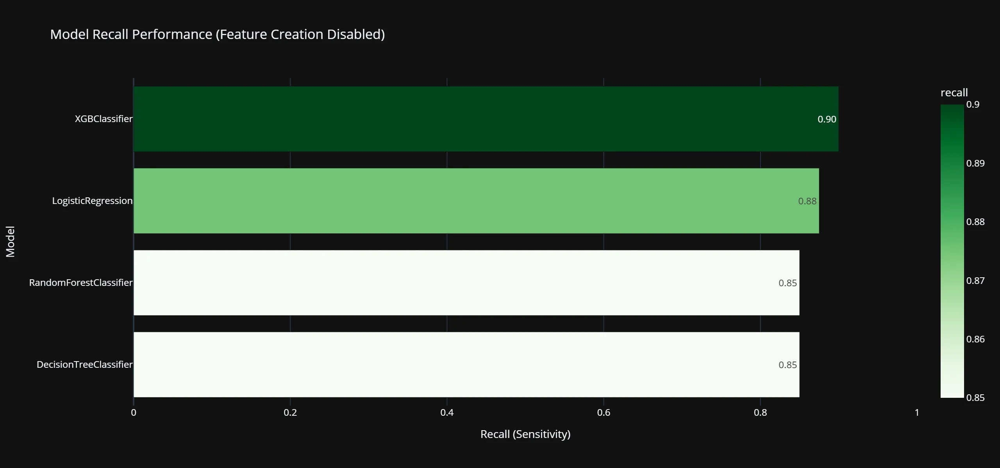

In [71]:
recall_fig = recall_fig.update_layout(title="Model Recall Performance (Feature Creation Disabled)")
show_plot(recall_fig)

In [25]:
ranked_df

,model_name,resampler_strategy,threshold,recall,precision,f1_score,accuracy,label
0,XGBClassifier,none,0.07,0.90,0.51,0.65,0.67,XGBClassifier (0.90)
1,LogisticRegression,RandomOverSampler,0.39,0.88,0.61,0.72,0.77,LogisticRegression (0.88)
2,RandomForestClassifier,SMOTE,0.41,0.85,0.60,0.70,0.75,RandomForestClassifier (0.85)
3,DecisionTreeClassifier,none,0.10,0.85,0.44,0.58,0.57,DecisionTreeClassifier (0.85)


### With Feature Creation

In [73]:
%%time
# Train models and collect all evaluation artifacts (with feature creation)

(
    model_metrics_wf,
    trained_models_wf,
    cm_figs_wf,
    model_leaderboard_fig_wf,
    resampler_leaderboard_fig_wf,
    test_model_metrics_wf,
    test_cm_figs_wf
) = evaluate_models(
    models=models,
    param_grids=param_grids,
    feature_creation_pipeline=feature_creation_pipeline,
    preprocessor=preprocessor,
    X_train=X_train,
    y_train_encoded=y_train_encoded,
    X_eval=X_eval,
    y_eval_encoded=y_eval_encoded,
    X_test=X_test,
    y_test=y_test_encoded,
    target_class=target_class_names,
    imbalance_strategy=True,   # resampling handled inside RandomizedSearchCV
    create_features=True,
    col_map=col_map,
    random_state=RANDOM_STATE,
    verbose=True               # show progress bar
)


Evaluating models:   0%|          | 0/4 [00:00<?, ?it/s][I 2026-02-05 05:52:37,527] A new study created in memory with name: no-name-347ba6a6-ce7e-47ea-a220-406b30f3359c

Evaluating models:   0%|          | 0/4 [00:03<?, ?it/s]

[I 2026-02-05 05:52:40,791] Trial 0 finished with values: [-0.267379679144385, 0.6650485436893204] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:05<?, ?it/s]

[I 2026-02-05 05:52:42,679] Trial 1 finished with values: [-0.25133689839572193, 0.6481481481481481] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:07<?, ?it/s]

[I 2026-02-05 05:52:44,819] Trial 2 finished with values: [-0.213903743315508, 0.6125] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:09<?, ?it/s]

[I 2026-02-05 05:52:47,475] Trial 3 finished with values: [-0.22994652406417115, 0.6206896551724138] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:12<?, ?it/s]

[I 2026-02-05 05:52:49,964] Trial 4 finished with values: [-0.4064171122994652, 0.6686746987951807] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:13<?, ?it/s]

[I 2026-02-05 05:52:51,131] Trial 5 finished with values: [-0.27807486631016043, 0.6053811659192825] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:14<?, ?it/s]

[I 2026-02-05 05:52:52,337] Trial 6 finished with values: [-0.23529411764705888, 0.6217391304347826] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:16<?, ?it/s]

[I 2026-02-05 05:52:53,823] Trial 7 finished with values: [-0.27807486631016043, 0.6428571428571429] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:19<?, ?it/s]

[I 2026-02-05 05:52:57,013] Trial 8 finished with values: [-0.2192513368983957, 0.6347826086956522] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:22<?, ?it/s]

[I 2026-02-05 05:52:59,528] Trial 9 finished with values: [-0.4064171122994652, 0.7115384615384616] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:25<?, ?it/s]

[I 2026-02-05 05:53:02,609] Trial 10 finished with values: [-0.267379679144385, 0.6650485436893204] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:27<?, ?it/s]

[I 2026-02-05 05:53:04,881] Trial 11 finished with values: [-0.267379679144385, 0.6372093023255814] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:29<?, ?it/s]

[I 2026-02-05 05:53:07,224] Trial 12 finished with values: [-0.2192513368983957, 0.6347826086956522] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:33<?, ?it/s]

[I 2026-02-05 05:53:10,643] Trial 13 finished with values: [-0.267379679144385, 0.6372093023255814] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:35<?, ?it/s]

[I 2026-02-05 05:53:13,162] Trial 14 finished with values: [-0.2620320855614974, 0.647887323943662] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:39<?, ?it/s]

[I 2026-02-05 05:53:16,545] Trial 15 finished with values: [-0.22459893048128343, 0.6331877729257642] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:42<?, ?it/s]

[I 2026-02-05 05:53:19,550] Trial 16 finished with values: [-0.25133689839572193, 0.6542056074766355] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:45<?, ?it/s]

[I 2026-02-05 05:53:23,219] Trial 17 finished with values: [-0.2727272727272727, 0.6296296296296297] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:48<?, ?it/s]

[I 2026-02-05 05:53:25,784] Trial 18 finished with values: [-0.25133689839572193, 0.6481481481481481] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [00:50<?, ?it/s]

[I 2026-02-05 05:53:28,137] Trial 19 finished with values: [-0.42245989304812837, 0.7248322147651006] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:54<?, ?it/s]

[I 2026-02-05 05:53:31,858] Trial 20 finished with values: [-0.22459893048128343, 0.6331877729257642] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [00:56<?, ?it/s]

[I 2026-02-05 05:53:34,469] Trial 21 finished with values: [-0.2406417112299465, 0.6367713004484304] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:00<?, ?it/s]

[I 2026-02-05 05:53:38,255] Trial 22 finished with values: [-0.25133689839572193, 0.6572769953051644] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:03<?, ?it/s]

[I 2026-02-05 05:53:41,397] Trial 23 finished with values: [-0.267379679144385, 0.6372093023255814] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:07<?, ?it/s]

[I 2026-02-05 05:53:44,722] Trial 24 finished with values: [-0.22459893048128343, 0.6304347826086957] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:09<?, ?it/s]

[I 2026-02-05 05:53:46,832] Trial 25 finished with values: [-0.2192513368983957, 0.6517857142857143] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:11<?, ?it/s]

[I 2026-02-05 05:53:48,946] Trial 26 finished with values: [-0.25133689839572193, 0.6334841628959276] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:13<?, ?it/s]

[I 2026-02-05 05:53:51,164] Trial 27 finished with values: [-0.25133689839572193, 0.660377358490566] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:15<?, ?it/s]

[I 2026-02-05 05:53:53,331] Trial 28 finished with values: [-0.25133689839572193, 0.6334841628959276] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:17<?, ?it/s]

[I 2026-02-05 05:53:55,302] Trial 29 finished with values: [-0.2406417112299465, 0.6635514018691588] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:19<?, ?it/s]

[I 2026-02-05 05:53:57,277] Trial 30 finished with values: [-0.2727272727272727, 0.6238532110091743] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:21<?, ?it/s]

[I 2026-02-05 05:53:59,413] Trial 31 finished with values: [-0.2459893048128342, 0.6588785046728972] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:24<?, ?it/s]

[I 2026-02-05 05:54:02,143] Trial 32 finished with values: [-0.25133689839572193, 0.6363636363636364] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:26<?, ?it/s]

[I 2026-02-05 05:54:03,929] Trial 33 finished with values: [-0.25668449197860965, 0.6587677725118484] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:28<?, ?it/s]

[I 2026-02-05 05:54:05,932] Trial 34 finished with values: [-0.2459893048128342, 0.6558139534883721] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:30<?, ?it/s]

[I 2026-02-05 05:54:07,745] Trial 35 finished with values: [-0.25668449197860965, 0.6465116279069767] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 0.01, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:32<?, ?it/s]

[I 2026-02-05 05:54:09,607] Trial 36 finished with values: [-0.25668449197860965, 0.6177777777777778] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:33<?, ?it/s]

[I 2026-02-05 05:54:10,873] Trial 37 finished with values: [-0.2406417112299465, 0.6635514018691588] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 18, 'classifier__C': 0.1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:35<?, ?it/s]

[I 2026-02-05 05:54:12,675] Trial 38 finished with values: [-0.25668449197860965, 0.6233183856502242] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:36<?, ?it/s]

[I 2026-02-05 05:54:14,451] Trial 39 finished with values: [-0.25133689839572193, 0.6481481481481481] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 18, 'classifier__C': 0.01, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:39<?, ?it/s]

[I 2026-02-05 05:54:16,521] Trial 40 finished with values: [-0.3850267379679144, 0.7142857142857143] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:40<?, ?it/s]

[I 2026-02-05 05:54:17,554] Trial 41 finished with values: [-0.2727272727272727, 0.6325581395348837] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:41<?, ?it/s]

[I 2026-02-05 05:54:19,053] Trial 42 finished with values: [-0.4010695187165776, 0.7225806451612903] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:42<?, ?it/s]

[I 2026-02-05 05:54:20,413] Trial 43 finished with values: [-0.2620320855614974, 0.6330275229357798] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:44<?, ?it/s]

[I 2026-02-05 05:54:22,279] Trial 44 finished with values: [-0.267379679144385, 0.6401869158878505] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:45<?, ?it/s]

[I 2026-02-05 05:54:23,263] Trial 45 finished with values: [-0.25668449197860965, 0.6123348017621145] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 1, 'classifier__solver': 'lbfgs', 'classifier__max_iter': 1000, 'classifier__class_weight': 'balanced'}.



Evaluating models:   0%|          | 0/4 [01:46<?, ?it/s]

[I 2026-02-05 05:54:24,223] Trial 46 finished with values: [-0.3743315508021391, 0.7177914110429447] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:47<?, ?it/s]

[I 2026-02-05 05:54:25,026] Trial 47 finished with values: [-0.36898395721925137, 0.7108433734939759] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



Evaluating models:   0%|          | 0/4 [01:48<?, ?it/s]

[I 2026-02-05 05:54:26,145] Trial 48 finished with values: [-0.23529411764705888, 0.6137339055793991] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.



100%|██████████| 50/50 [01:49<00:00,  2.19s/it]?, ?it/s]


[I 2026-02-05 05:54:26,958] Trial 49 finished with values: [-0.3529411764705882, 0.6994219653179191] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 24, 'classifier__C': 10, 'classifier__solver': 'liblinear', 'classifier__max_iter': 1000, 'classifier__class_weight': None}.


Evaluating models:  25%|██▌       | 1/4 [01:50<05:30, 110.14s/it][I 2026-02-05 05:54:27,672] A new study created in memory with name: no-name-de626dad-d5b9-46f0-8424-e5dafcb3f3e6

Evaluating models:  25%|██▌       | 1/4 [01:57<05:30, 110.14s/it]

[I 2026-02-05 05:54:34,794] Trial 0 finished with values: [-0.17647058823529416, -0.43173431734317347] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [02:07<05:30, 110.14s/it]

[I 2026-02-05 05:54:45,144] Trial 1 finished with values: [-0.23529411764705888, 0.6033755274261603] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [02:24<05:30, 110.14s/it]

[I 2026-02-05 05:55:02,064] Trial 2 finished with values: [-0.3262032085561497, 0.6331658291457286] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [02:52<05:30, 110.14s/it]

[I 2026-02-05 05:55:29,622] Trial 3 finished with values: [-0.25133689839572193, 0.6008583690987125] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 8, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [03:17<05:30, 110.14s/it]

[I 2026-02-05 05:55:55,001] Trial 4 finished with values: [-0.2941176470588235, 0.6111111111111112] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [03:29<05:30, 110.14s/it]

[I 2026-02-05 05:56:06,768] Trial 5 finished with values: [-0.2941176470588235, 0.6439024390243903] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [04:02<05:30, 110.14s/it]

[I 2026-02-05 05:56:39,655] Trial 6 finished with values: [-0.2620320855614974, -0.4025974025974026] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [04:10<05:30, 110.14s/it]

[I 2026-02-05 05:56:47,904] Trial 7 finished with values: [-0.3262032085561497, 0.6461538461538462] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [04:19<05:30, 110.14s/it]

[I 2026-02-05 05:56:57,493] Trial 8 finished with values: [-0.2406417112299465, 0.6120689655172413] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [04:32<05:30, 110.14s/it]

[I 2026-02-05 05:57:10,187] Trial 9 finished with values: [-0.18181818181818177, -0.4354243542435424] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [05:01<05:30, 110.14s/it]

[I 2026-02-05 05:57:38,951] Trial 10 finished with values: [-0.3475935828877005, 0.6224489795918368] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [05:07<05:30, 110.14s/it]

[I 2026-02-05 05:57:45,407] Trial 11 finished with values: [-0.2941176470588235, 0.6197183098591549] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [05:14<05:30, 110.14s/it]

[I 2026-02-05 05:57:52,287] Trial 12 finished with values: [-0.31550802139037437, 0.649746192893401] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [05:22<05:30, 110.14s/it]

[I 2026-02-05 05:57:59,522] Trial 13 finished with values: [-0.14973262032085566, -0.44982698961937717] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [05:35<05:30, 110.14s/it]

[I 2026-02-05 05:58:12,951] Trial 14 finished with values: [-0.2459893048128342, 0.6130434782608696] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [05:47<05:30, 110.14s/it]

[I 2026-02-05 05:58:25,422] Trial 15 finished with values: [-0.31550802139037437, 0.6153846153846154] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [05:58<05:30, 110.14s/it]

[I 2026-02-05 05:58:36,369] Trial 16 finished with values: [-0.3262032085561497, 0.6528497409326425] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:12<05:30, 110.14s/it]

[I 2026-02-05 05:58:50,099] Trial 17 finished with values: [-0.17112299465240643, -0.454225352112676] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [06:25<05:30, 110.14s/it]

[I 2026-02-05 05:59:02,733] Trial 18 finished with values: [-0.23529411764705888, 0.6033755274261603] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [06:34<05:30, 110.14s/it]

[I 2026-02-05 05:59:11,965] Trial 19 finished with values: [-0.2941176470588235, 0.6285714285714286] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [06:56<05:30, 110.14s/it]

[I 2026-02-05 05:59:33,635] Trial 20 finished with values: [-0.2406417112299465, 0.6042553191489362] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [07:05<05:30, 110.14s/it]

[I 2026-02-05 05:59:42,727] Trial 21 finished with values: [-0.2620320855614974, -0.4177215189873418] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [07:13<05:30, 110.14s/it]

[I 2026-02-05 05:59:51,419] Trial 22 finished with values: [-0.34224598930481287, 0.6758241758241759] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [07:44<05:30, 110.14s/it]

[I 2026-02-05 06:00:21,969] Trial 23 finished with values: [-0.320855614973262, 0.6195121951219512] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [08:05<05:30, 110.14s/it]

[I 2026-02-05 06:00:42,985] Trial 24 finished with values: [-0.19786096256684493, -0.41634241245136183] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [08:20<05:30, 110.14s/it]

[I 2026-02-05 06:00:57,786] Trial 25 finished with values: [-0.2941176470588235, 0.6407766990291263] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [08:40<05:30, 110.14s/it]

[I 2026-02-05 06:01:17,599] Trial 26 finished with values: [-0.31550802139037437, 0.6124401913875598] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [08:51<05:30, 110.14s/it]

[I 2026-02-05 06:01:29,084] Trial 27 finished with values: [-0.15508021390374327, -0.45704467353951894] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [09:21<05:30, 110.14s/it]

[I 2026-02-05 06:01:59,146] Trial 28 finished with values: [-0.36363636363636365, 0.664804469273743] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 10, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [09:33<05:30, 110.14s/it]

[I 2026-02-05 06:02:10,721] Trial 29 finished with values: [-0.17647058823529416, -0.43173431734317347] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [09:42<05:30, 110.14s/it]

[I 2026-02-05 06:02:19,791] Trial 30 finished with values: [-0.2406417112299465, 0.6120689655172413] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'sqrt', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [09:55<05:30, 110.14s/it]

[I 2026-02-05 06:02:33,343] Trial 31 finished with values: [-0.19786096256684493, -0.41634241245136183] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [10:09<05:30, 110.14s/it]

[I 2026-02-05 06:02:46,663] Trial 32 finished with values: [-0.23529411764705888, 0.6033755274261603] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [10:34<05:30, 110.14s/it]

[I 2026-02-05 06:03:11,966] Trial 33 finished with values: [-0.2994652406417112, 0.6238095238095238] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [11:01<05:30, 110.14s/it]

[I 2026-02-05 06:03:39,316] Trial 34 finished with values: [-0.20320855614973266, -0.4202334630350194] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [11:25<05:30, 110.14s/it]

[I 2026-02-05 06:04:02,653] Trial 35 finished with values: [-0.31016042780748665, 0.6354679802955665] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 8, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [11:33<05:30, 110.14s/it]

[I 2026-02-05 06:04:11,159] Trial 36 finished with values: [-0.2887700534759359, 0.6244131455399061] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



Evaluating models:  25%|██▌       | 1/4 [11:47<05:30, 110.14s/it]

[I 2026-02-05 06:04:25,347] Trial 37 finished with values: [-0.267379679144385, -0.4043478260869565] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 8, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__max_features': None, 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [12:11<05:30, 110.14s/it]

[I 2026-02-05 06:04:48,564] Trial 38 finished with values: [-0.3529411764705882, 0.6470588235294118] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 10, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__max_features': None, 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [12:23<05:30, 110.14s/it]

[I 2026-02-05 06:05:01,049] Trial 39 finished with values: [-0.22459893048128343, 0.6041666666666666] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [12:37<05:30, 110.14s/it]

[I 2026-02-05 06:05:15,509] Trial 40 finished with values: [-0.1925133689839572, -0.42366412213740456] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [12:49<05:30, 110.14s/it]

[I 2026-02-05 06:05:26,801] Trial 41 finished with values: [-0.22459893048128343, 0.6041666666666666] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [13:02<05:30, 110.14s/it]

[I 2026-02-05 06:05:39,659] Trial 42 finished with values: [-0.22459893048128343, 0.6041666666666666] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [13:14<05:30, 110.14s/it]

[I 2026-02-05 06:05:51,900] Trial 43 finished with values: [-0.1871657754010695, -0.4391143911439115] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 3}}.



Evaluating models:  25%|██▌       | 1/4 [13:25<05:30, 110.14s/it]

[I 2026-02-05 06:06:02,902] Trial 44 finished with values: [-0.18181818181818177, -0.43333333333333335] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 2}}.



Evaluating models:  25%|██▌       | 1/4 [13:37<05:30, 110.14s/it]

[I 2026-02-05 06:06:14,805] Trial 45 finished with values: [-0.19786096256684493, -0.40711462450592883] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [13:49<05:30, 110.14s/it]

[I 2026-02-05 06:06:26,858] Trial 46 finished with values: [-0.17647058823529416, -0.44802867383512546] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__class_weight': {0: 1, 1: 4}}.



Evaluating models:  25%|██▌       | 1/4 [14:04<05:30, 110.14s/it]

[I 2026-02-05 06:06:41,719] Trial 47 finished with values: [-0.39037433155080214, 0.6785714285714286] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'log2', 'classifier__class_weight': 'balanced'}.



Evaluating models:  25%|██▌       | 1/4 [14:19<05:30, 110.14s/it]

[I 2026-02-05 06:06:57,053] Trial 48 finished with values: [-0.22459893048128343, 0.625] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.



100%|██████████| 50/50 [12:44<00:00, 15.29s/it]05:30, 110.14s/it]


[I 2026-02-05 06:07:12,295] Trial 49 finished with values: [-0.22459893048128343, 0.625] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 3, 'classifier__max_features': 'log2', 'classifier__class_weight': None}.


Evaluating models:  50%|█████     | 2/4 [14:37<16:33, 496.56s/it][I 2026-02-05 06:07:14,730] A new study created in memory with name: no-name-620ab100-82ce-41d4-bc9f-fca8fc18fc8f

Evaluating models:  50%|█████     | 2/4 [14:39<16:33, 496.56s/it]

[I 2026-02-05 06:07:16,634] Trial 0 finished with values: [-0.3796791443850267, -0.4423076923076923] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:40<16:33, 496.56s/it]

[I 2026-02-05 06:07:18,124] Trial 1 finished with values: [-0.31550802139037437, -0.4285714285714286] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:42<16:33, 496.56s/it]

[I 2026-02-05 06:07:19,866] Trial 2 finished with values: [-0.2887700534759359, -0.4571428571428572] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [14:44<16:33, 496.56s/it]

[I 2026-02-05 06:07:21,912] Trial 3 finished with values: [-0.28342245989304815, -0.44398340248962653] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [14:46<16:33, 496.56s/it]

[I 2026-02-05 06:07:23,691] Trial 4 finished with values: [-0.2620320855614974, -0.49264705882352944] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:47<16:33, 496.56s/it]

[I 2026-02-05 06:07:25,182] Trial 5 finished with values: [-0.2994652406417112, -0.4609053497942387] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:49<16:33, 496.56s/it]

[I 2026-02-05 06:07:27,042] Trial 6 finished with values: [-0.3315508021390374, -0.4075829383886256] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [14:50<16:33, 496.56s/it]

[I 2026-02-05 06:07:28,291] Trial 7 finished with values: [-0.31550802139037437, -0.46218487394957986] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [14:53<16:33, 496.56s/it]

[I 2026-02-05 06:07:31,039] Trial 8 finished with values: [-0.3475935828877005, -0.44036697247706424] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:56<16:33, 496.56s/it]

[I 2026-02-05 06:07:33,867] Trial 9 finished with values: [-0.2620320855614974, -0.5053763440860215] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [14:58<16:33, 496.56s/it]

[I 2026-02-05 06:07:36,449] Trial 10 finished with values: [-0.28342245989304815, -0.44855967078189296] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:01<16:33, 496.56s/it]

[I 2026-02-05 06:07:38,652] Trial 11 finished with values: [-0.2994652406417112, -0.40990990990990994] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:03<16:33, 496.56s/it]

[I 2026-02-05 06:07:41,070] Trial 12 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:05<16:33, 496.56s/it]

[I 2026-02-05 06:07:43,184] Trial 13 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:07<16:33, 496.56s/it]

[I 2026-02-05 06:07:45,381] Trial 14 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:09<16:33, 496.56s/it]

[I 2026-02-05 06:07:46,895] Trial 15 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:12<16:33, 496.56s/it]

[I 2026-02-05 06:07:49,516] Trial 16 finished with values: [-0.4278074866310161, -0.5023255813953489] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:13<16:33, 496.56s/it]

[I 2026-02-05 06:07:51,293] Trial 17 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:16<16:33, 496.56s/it]

[I 2026-02-05 06:07:54,081] Trial 18 finished with values: [-0.2994652406417112, -0.40990990990990994] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:19<16:33, 496.56s/it]

[I 2026-02-05 06:07:56,947] Trial 19 finished with values: [-0.4278074866310161, -0.5023255813953489] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:22<16:33, 496.56s/it]

[I 2026-02-05 06:07:59,563] Trial 20 finished with values: [-0.2887700534759359, -0.4217391304347826] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:24<16:33, 496.56s/it]

[I 2026-02-05 06:08:01,885] Trial 21 finished with values: [-0.2887700534759359, -0.4217391304347826] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:25<16:33, 496.56s/it]

[I 2026-02-05 06:08:03,349] Trial 22 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:28<16:33, 496.56s/it]

[I 2026-02-05 06:08:05,595] Trial 23 finished with values: [-0.2887700534759359, -0.4217391304347826] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:29<16:33, 496.56s/it]

[I 2026-02-05 06:08:07,000] Trial 24 finished with values: [-0.2620320855614974, -0.43673469387755104] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:32<16:33, 496.56s/it]

[I 2026-02-05 06:08:09,537] Trial 25 finished with values: [-0.3743315508021391, -0.49350649350649356] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:34<16:33, 496.56s/it]

[I 2026-02-05 06:08:11,778] Trial 26 finished with values: [-0.2994652406417112, -0.5183823529411764] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:36<16:33, 496.56s/it]

[I 2026-02-05 06:08:14,293] Trial 27 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:38<16:33, 496.56s/it]

[I 2026-02-05 06:08:16,052] Trial 28 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:40<16:33, 496.56s/it]

[I 2026-02-05 06:08:17,979] Trial 29 finished with values: [-0.3529411764705882, -0.44239631336405527] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [15:42<16:33, 496.56s/it]

[I 2026-02-05 06:08:19,943] Trial 30 finished with values: [-0.2994652406417112, -0.4304347826086956] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:44<16:33, 496.56s/it]

[I 2026-02-05 06:08:22,238] Trial 31 finished with values: [-0.2887700534759359, -0.4217391304347826] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:46<16:33, 496.56s/it]

[I 2026-02-05 06:08:24,426] Trial 32 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:48<16:33, 496.56s/it]

[I 2026-02-05 06:08:26,400] Trial 33 finished with values: [-0.2994652406417112, -0.40990990990990994] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:50<16:33, 496.56s/it]

[I 2026-02-05 06:08:28,090] Trial 34 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:52<16:33, 496.56s/it]

[I 2026-02-05 06:08:30,080] Trial 35 finished with values: [-0.2941176470588235, -0.45679012345679015] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [15:54<16:33, 496.56s/it]

[I 2026-02-05 06:08:32,346] Trial 36 finished with values: [-0.2994652406417112, -0.40990990990990994] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [15:56<16:33, 496.56s/it]

[I 2026-02-05 06:08:34,458] Trial 37 finished with values: [-0.31550802139037437, -0.4285714285714286] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [15:59<16:33, 496.56s/it]

[I 2026-02-05 06:08:36,817] Trial 38 finished with values: [-0.34224598930481287, -0.45333333333333337] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': None, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:00<16:33, 496.56s/it]

[I 2026-02-05 06:08:38,399] Trial 39 finished with values: [-0.2887700534759359, -0.4571428571428572] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [16:02<16:33, 496.56s/it]

[I 2026-02-05 06:08:40,508] Trial 40 finished with values: [-0.3315508021390374, -0.4075829383886256] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [16:05<16:33, 496.56s/it]

[I 2026-02-05 06:08:42,682] Trial 41 finished with values: [-0.3315508021390374, -0.4075829383886256] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:07<16:33, 496.56s/it]

[I 2026-02-05 06:08:44,701] Trial 42 finished with values: [-0.25668449197860965, -0.4484126984126984] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:08<16:33, 496.56s/it]

[I 2026-02-05 06:08:46,342] Trial 43 finished with values: [-0.3529411764705882, -0.42105263157894735] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:10<16:33, 496.56s/it]

[I 2026-02-05 06:08:48,504] Trial 44 finished with values: [-0.28342245989304815, -0.44855967078189296] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': None, 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.



Evaluating models:  50%|█████     | 2/4 [16:12<16:33, 496.56s/it]

[I 2026-02-05 06:08:50,427] Trial 45 finished with values: [-0.25133689839572193, -0.43999999999999995] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:14<16:33, 496.56s/it]

[I 2026-02-05 06:08:52,063] Trial 46 finished with values: [-0.25133689839572193, -0.4509803921568627] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 5, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0005}.



Evaluating models:  50%|█████     | 2/4 [16:17<16:33, 496.56s/it]

[I 2026-02-05 06:08:54,561] Trial 47 finished with values: [-0.31016042780748665, -0.47346938775510206] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': None, 'classifier__max_features': None, 'classifier__ccp_alpha': 0.0001}.



Evaluating models:  50%|█████     | 2/4 [16:18<16:33, 496.56s/it]

[I 2026-02-05 06:08:56,263] Trial 48 finished with values: [-0.31016042780748665, -0.4342105263157895] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 6, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 2, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'sqrt', 'classifier__ccp_alpha': 0.0001}.



100%|██████████| 50/50 [01:43<00:00,  2.06s/it]16:33, 496.56s/it]


[I 2026-02-05 06:08:57,906] Trial 49 finished with values: [-0.267379679144385, -0.4408163265306122] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__max_depth': 4, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__class_weight': 'balanced', 'classifier__max_features': 'log2', 'classifier__ccp_alpha': 0.0}.


Evaluating models:  75%|███████▌  | 3/4 [16:21<05:17, 317.28s/it][I 2026-02-05 06:08:58,667] A new study created in memory with name: no-name-ad0bb6f8-977d-4324-8292-6b29e3dbbf21

Evaluating models:  75%|███████▌  | 3/4 [16:25<05:17, 317.28s/it]

[I 2026-02-05 06:09:02,949] Trial 0 finished with values: [-0.3262032085561497, 0.6146341463414634] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:28<05:17, 317.28s/it]

[I 2026-02-05 06:09:06,485] Trial 1 finished with values: [-0.4064171122994652, 0.6491228070175439] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:34<05:17, 317.28s/it]

[I 2026-02-05 06:09:12,011] Trial 2 finished with values: [-0.320855614973262, 0.6135265700483091] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:38<05:17, 317.28s/it]

[I 2026-02-05 06:09:15,653] Trial 3 finished with values: [-0.3529411764705882, 0.605] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:42<05:17, 317.28s/it]

[I 2026-02-05 06:09:19,930] Trial 4 finished with values: [-0.3529411764705882, 0.6269430051813472] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:46<05:17, 317.28s/it]

[I 2026-02-05 06:09:23,830] Trial 5 finished with values: [-0.20855614973262027, -0.421875] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:49<05:17, 317.28s/it]

[I 2026-02-05 06:09:26,764] Trial 6 finished with values: [-0.3582887700534759, 0.6282722513089005] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [16:53<05:17, 317.28s/it]

[I 2026-02-05 06:09:30,955] Trial 7 finished with values: [-0.320855614973262, 0.6287128712871287] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [16:58<05:17, 317.28s/it]

[I 2026-02-05 06:09:35,667] Trial 8 finished with values: [-0.3475935828877005, 0.61] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [17:01<05:17, 317.28s/it]

[I 2026-02-05 06:09:38,994] Trial 9 finished with values: [-0.34224598930481287, 0.6180904522613065] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:05<05:17, 317.28s/it]

[I 2026-02-05 06:09:43,119] Trial 10 finished with values: [-0.3315508021390374, 0.628140703517588] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:09<05:17, 317.28s/it]

[I 2026-02-05 06:09:46,540] Trial 11 finished with values: [-0.23529411764705888, -0.4392156862745098] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [17:12<05:17, 317.28s/it]

[I 2026-02-05 06:09:49,828] Trial 12 finished with values: [-0.320855614973262, 0.6287128712871287] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [17:15<05:17, 317.28s/it]

[I 2026-02-05 06:09:53,360] Trial 13 finished with values: [-0.2192513368983957, -0.43190661478599224] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:19<05:17, 317.28s/it]

[I 2026-02-05 06:09:57,227] Trial 14 finished with values: [-0.3315508021390374, 0.6218905472636815] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [17:23<05:17, 317.28s/it]

[I 2026-02-05 06:10:00,609] Trial 15 finished with values: [-0.3475935828877005, 0.6354166666666666] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [17:28<05:17, 317.28s/it]

[I 2026-02-05 06:10:06,426] Trial 16 finished with values: [-0.31550802139037437, 0.624390243902439] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:36<05:17, 317.28s/it]

[I 2026-02-05 06:10:14,027] Trial 17 finished with values: [-0.213903743315508, -0.42801556420233466] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:42<05:17, 317.28s/it]

[I 2026-02-05 06:10:19,891] Trial 18 finished with values: [-0.31550802139037437, 0.6037735849056604] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:48<05:17, 317.28s/it]

[I 2026-02-05 06:10:26,099] Trial 19 finished with values: [-0.3529411764705882, 0.6335078534031413] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [17:54<05:17, 317.28s/it]

[I 2026-02-05 06:10:32,021] Trial 20 finished with values: [-0.34224598930481287, 0.615] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:01<05:17, 317.28s/it]

[I 2026-02-05 06:10:38,811] Trial 21 finished with values: [-0.31550802139037437, 0.6037735849056604] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:07<05:17, 317.28s/it]

[I 2026-02-05 06:10:44,708] Trial 22 finished with values: [-0.39572192513368987, 0.653179190751445] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:11<05:17, 317.28s/it]

[I 2026-02-05 06:10:49,313] Trial 23 finished with values: [-0.3262032085561497, 0.6494845360824743] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:17<05:17, 317.28s/it]

[I 2026-02-05 06:10:54,702] Trial 24 finished with values: [-0.213903743315508, -0.43243243243243246] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:22<05:17, 317.28s/it]

[I 2026-02-05 06:11:00,159] Trial 25 finished with values: [-0.267379679144385, -0.4243697478991597] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:27<05:17, 317.28s/it]

[I 2026-02-05 06:11:05,265] Trial 26 finished with values: [-0.31550802139037437, 0.624390243902439] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:33<05:17, 317.28s/it]

[I 2026-02-05 06:11:11,362] Trial 27 finished with values: [-0.3315508021390374, 0.6097560975609756] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:37<05:17, 317.28s/it]

[I 2026-02-05 06:11:15,211] Trial 28 finished with values: [-0.22994652406417115, -0.40740740740740744] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:41<05:17, 317.28s/it]

[I 2026-02-05 06:11:19,272] Trial 29 finished with values: [-0.3743315508021391, 0.6290322580645161] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:46<05:17, 317.28s/it]

[I 2026-02-05 06:11:24,118] Trial 30 finished with values: [-0.3529411764705882, 0.6368421052631579] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:50<05:17, 317.28s/it]

[I 2026-02-05 06:11:28,386] Trial 31 finished with values: [-0.31550802139037437, 0.624390243902439] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:54<05:17, 317.28s/it]

[I 2026-02-05 06:11:32,262] Trial 32 finished with values: [-0.320855614973262, 0.635] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [18:59<05:17, 317.28s/it]

[I 2026-02-05 06:11:36,534] Trial 33 finished with values: [-0.3582887700534759, 0.6486486486486487] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:03<05:17, 317.28s/it]

[I 2026-02-05 06:11:40,599] Trial 34 finished with values: [-0.3582887700534759, 0.6486486486486487] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:07<05:17, 317.28s/it]

[I 2026-02-05 06:11:45,477] Trial 35 finished with values: [-0.33689839572192515, 0.6108374384236454] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [19:11<05:17, 317.28s/it]

[I 2026-02-05 06:11:48,515] Trial 36 finished with values: [-0.3582887700534759, 0.6451612903225806] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [19:15<05:17, 317.28s/it]

[I 2026-02-05 06:11:53,272] Trial 37 finished with values: [-0.320855614973262, 0.6076555023923444] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:19<05:17, 317.28s/it]

[I 2026-02-05 06:11:56,597] Trial 38 finished with values: [-0.25133689839572193, -0.4238683127572016] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [19:24<05:17, 317.28s/it]

[I 2026-02-05 06:12:02,475] Trial 39 finished with values: [-0.320855614973262, 0.616504854368932] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:30<05:17, 317.28s/it]

[I 2026-02-05 06:12:08,172] Trial 40 finished with values: [-0.3315508021390374, 0.6157635467980296] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [19:35<05:17, 317.28s/it]

[I 2026-02-05 06:12:13,096] Trial 41 finished with values: [-0.39572192513368987, 0.653179190751445] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:40<05:17, 317.28s/it]

[I 2026-02-05 06:12:17,618] Trial 42 finished with values: [-0.3262032085561497, 0.6494845360824743] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:47<05:17, 317.28s/it]

[I 2026-02-05 06:12:25,132] Trial 43 finished with values: [-0.36363636363636365, 0.6102564102564103] and parameters: {'resampler': SMOTE(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [19:55<05:17, 317.28s/it]

[I 2026-02-05 06:12:33,359] Trial 44 finished with values: [-0.3529411764705882, 0.6402116402116402] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 1.0, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [20:04<05:17, 317.28s/it]

[I 2026-02-05 06:12:42,402] Trial 45 finished with values: [-0.23529411764705888, -0.42800000000000005] and parameters: {'resampler': RandomUnderSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [20:11<05:17, 317.28s/it]

[I 2026-02-05 06:12:49,425] Trial 46 finished with values: [-0.36363636363636365, 0.6230366492146597] and parameters: {'resampler': 'passthrough', 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.05, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



Evaluating models:  75%|███████▌  | 3/4 [20:17<05:17, 317.28s/it]

[I 2026-02-05 06:12:54,808] Trial 47 finished with values: [-0.3262032085561497, 0.6331658291457286] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 600, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.



Evaluating models:  75%|███████▌  | 3/4 [20:21<05:17, 317.28s/it]

[I 2026-02-05 06:12:58,958] Trial 48 finished with values: [-0.3315508021390374, 0.6157635467980296] and parameters: {'resampler': SMOTETomek(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 400, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.1, 'classifier__subsample': 0.8, 'classifier__colsample_bytree': 0.8, 'classifier__scale_pos_weight': 2.5, 'classifier__min_child_weight': 2, 'classifier__gamma': 0.1}.



100%|██████████| 50/50 [04:06<00:00,  4.94s/it]05:17, 317.28s/it]


[I 2026-02-05 06:13:05,617] Trial 49 finished with values: [-0.34224598930481287, 0.6180904522613065] and parameters: {'resampler': RandomOverSampler(random_state=2026), 'feature_selector__k': 'all', 'classifier__n_estimators': 800, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03, 'classifier__subsample': 0.9, 'classifier__colsample_bytree': 0.9, 'classifier__scale_pos_weight': np.float64(1.8716577540106951), 'classifier__min_child_weight': 1, 'classifier__gamma': 0}.


Evaluating models: 100%|██████████| 4/4 [20:29<00:00, 307.36s/it]


CPU times: total: 17min 21s
Wall time: 20min 29s


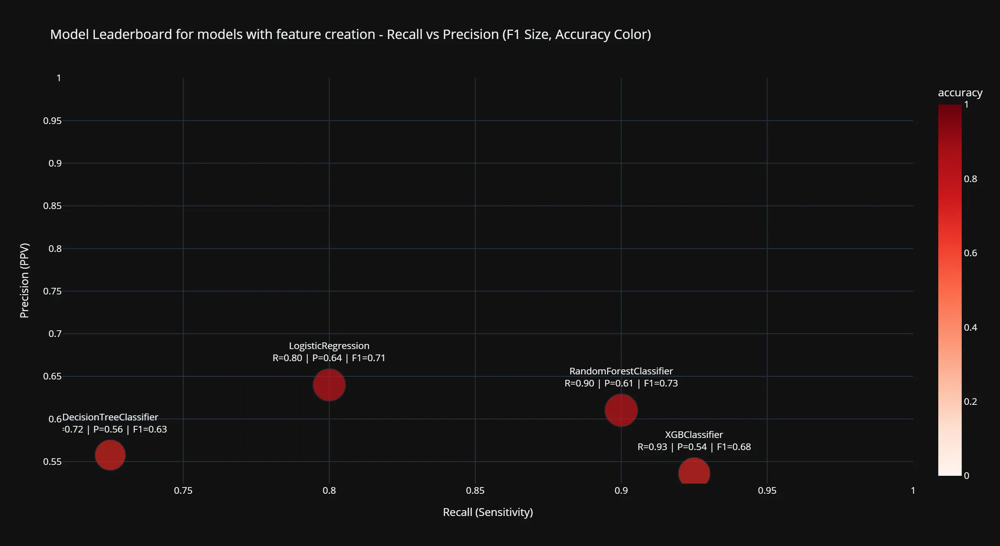

In [74]:
model_leaderboard_fig_wf.update_layout(
    title="Model Leaderboard for models with feature creation - Recall vs Precision (F1 Size, Accuracy Color)",
)
show_plot(model_leaderboard_fig_wf)

Confusion Matrix for all models with feature creation



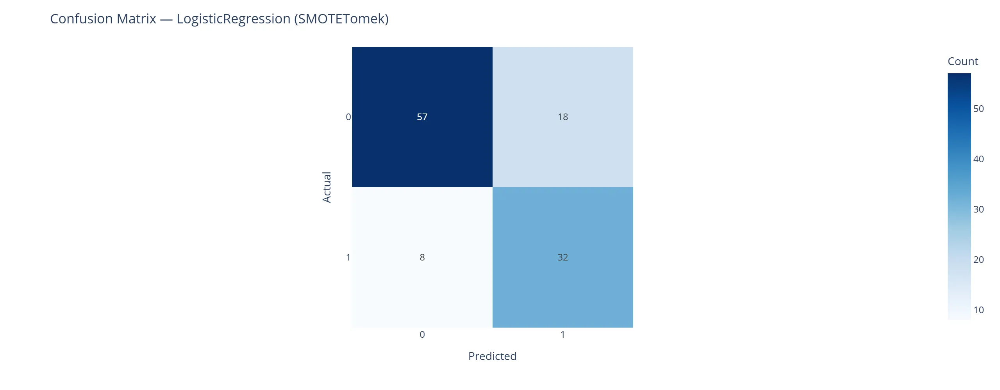

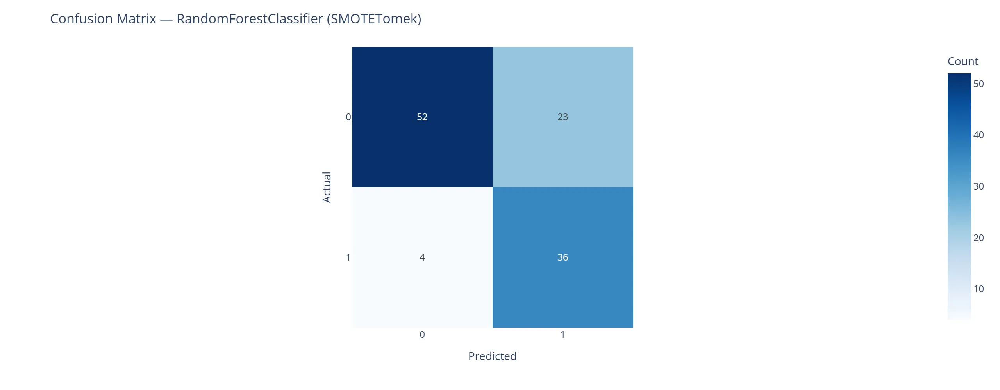

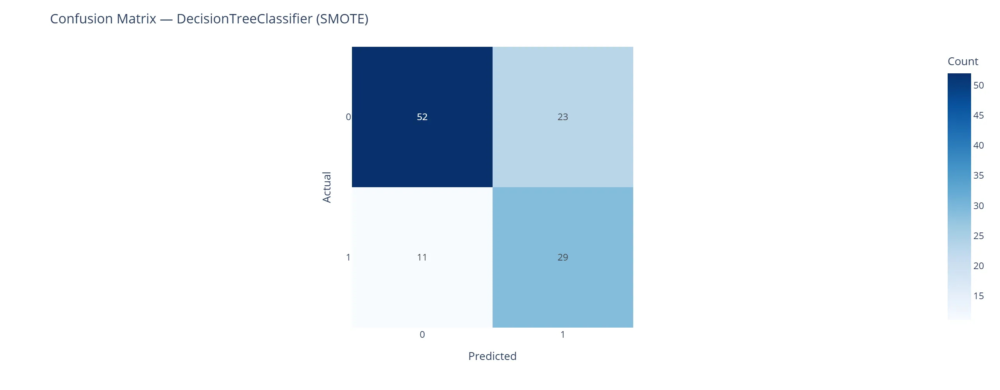

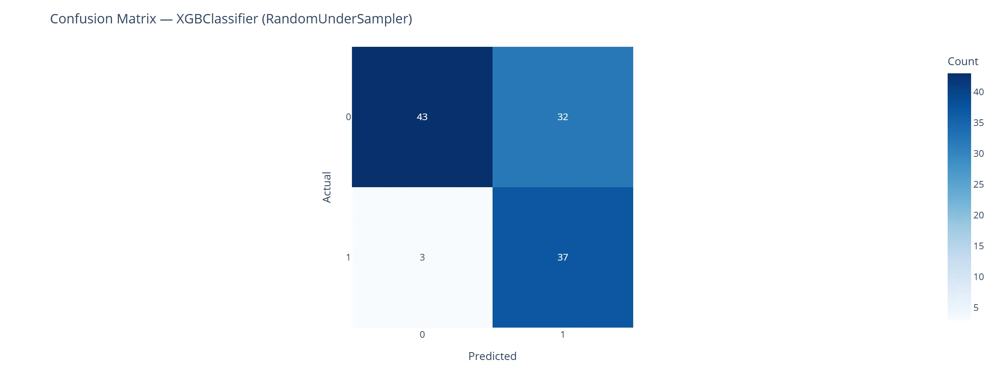

[WindowsPath('../plots/confusion_matrix_logisticregression_smotetomek.webp'),
 WindowsPath('../plots/confusion_matrix_randomforestclassifier_smotetomek.webp'),
 WindowsPath('../plots/confusion_matrix_decisiontreeclassifier_smote.webp'),
 WindowsPath('../plots/confusion_matrix_xgbclassifier_randomundersampler.webp')]

In [29]:
print("Confusion Matrix for all models with feature creation\n")
show_plots(cm_figs_wf.values())

In [75]:
ranked_df_wf, recall_fig_wf = summarize_recall_plotly(model_metrics_wf)


In [76]:
recall_fig_wf = recall_fig_wf.update_layout(title="Model Recall Performance (Feature Creation Enabled)")

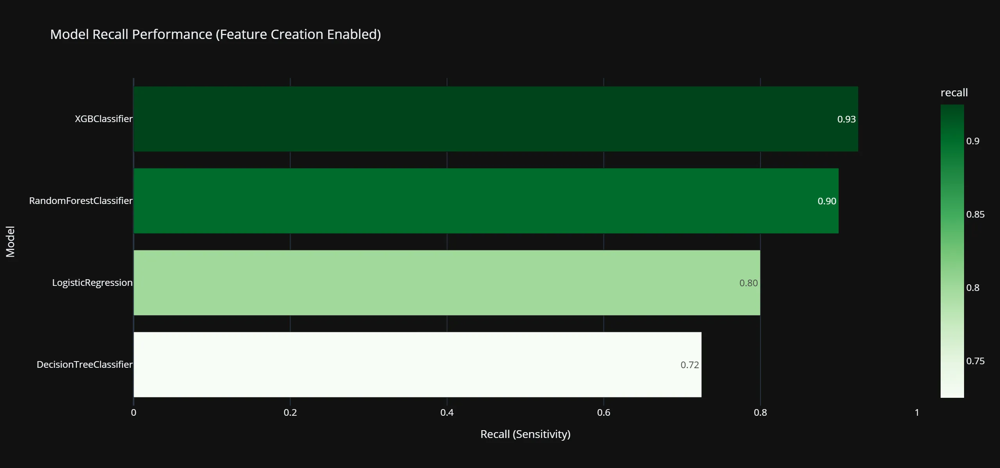

In [77]:
show_plot(recall_fig_wf, skip=False)

In [84]:
test_model_metrics_wf.sort_values(by="recall", ascending=False)

,model_name,threshold,recall,precision,f1_score,accuracy
3,XGBClassifier,0.08,0.90,0.50,0.64,0.65
1,RandomForestClassifier,0.41,0.80,0.51,0.62,0.66
2,DecisionTreeClassifier,0.16,0.80,0.53,0.64,0.68
0,LogisticRegression,0.37,0.68,0.54,0.60,0.68


In [78]:
ranked_df

,model_name,resampler_strategy,threshold,recall,precision,f1_score,accuracy,label
0,XGBClassifier,none,0.07,0.90,0.51,0.65,0.67,XGBClassifier (0.90)
1,LogisticRegression,RandomOverSampler,0.39,0.88,0.61,0.72,0.77,LogisticRegression (0.88)
2,RandomForestClassifier,SMOTE,0.41,0.85,0.60,0.70,0.75,RandomForestClassifier (0.85)
3,DecisionTreeClassifier,none,0.10,0.85,0.44,0.58,0.57,DecisionTreeClassifier (0.85)


In [79]:
ranked_df_wf

,model_name,resampler_strategy,threshold,recall,precision,f1_score,accuracy,label
0,XGBClassifier,RandomUnderSampler,0.08,0.93,0.54,0.68,0.70,XGBClassifier (0.93)
1,RandomForestClassifier,SMOTETomek,0.41,0.90,0.61,0.73,0.77,RandomForestClassifier (0.90)
2,LogisticRegression,SMOTETomek,0.37,0.80,0.64,0.71,0.77,LogisticRegression (0.80)
3,DecisionTreeClassifier,SMOTE,0.16,0.72,0.56,0.63,0.70,DecisionTreeClassifier (0.72)


### 4.2 Compare model evaluation report on models with and without feature creation


### 4.3.6  Plot the ROC-AUC Curve for all models

In [35]:
def build_roc_and_confusion_artifacts(
    trained_models: Dict[str, object],
    X_eval,
    y_eval_encoded,
    *,
    fig_title: str = "ROC AUC Curve",
    fig_height: int = 800,
) -> Tuple[go.Figure, Dict[str, pd.DataFrame], Dict[str, object]]:
    """
    Builds a ROC curve figure, ROC data tables, and confusion matrices
    for a collection of trained classification pipelines.

    Args:
        trained_models: Mapping of model name to trained pipeline.
        X_eval: Evaluation feature matrix.
        y_eval_encoded: Encoded ground truth labels.
        fig_title: Title for the ROC plot.
        fig_height: Height of the ROC figure.

    Returns:
        fig: Plotly ROC curve figure.
        all_roc_data: Dict of model_name -> ROC DataFrame.
        all_confusion_matrix: Dict of model_name -> confusion matrix.
    """

    fig = go.Figure()
    all_roc_data: Dict[str, pd.DataFrame] = {}
    all_confusion_matrix: Dict[str, object] = {}
    roc_artifacts: List[Dict[str, object]] = []

    for model_name, pipeline in trained_models.items():
        # ROC computation
        y_score = pipeline.predict_proba(X_eval)[:, 1]
        fpr, tpr, thresholds = roc_curve(y_eval_encoded, y_score)
        roc_auc = auc(fpr, tpr)

        roc_artifacts.append(
            {
                "model": model_name,
                "fpr": fpr,
                "tpr": tpr,
                "auc": roc_auc,
                "thresholds": thresholds,
            }
        )

        all_roc_data[model_name] = pd.DataFrame(
            {
                "False Positive Rate": fpr,
                "True Positive Rate": tpr,
                "Thresholds": thresholds,
            }
        )

        # Confusion matrix
        y_pred = pipeline.predict(X_eval)
        all_confusion_matrix[model_name] = confusion_matrix(
            y_eval_encoded, y_pred
        )


    # Add ROC trace
    for item in sorted(roc_artifacts, key=lambda x: x["auc"], reverse=True):
        fig.add_trace(
            go.Scatter(
                x=item["fpr"],
                y=item["tpr"],
                mode="lines",
                name=f"{item['model']} (AUC = {item['auc']:.2f})",
            )
        )


    # Layout + diagonal reference
    fig.update_layout(
        title=fig_title,
        xaxis_title="False Positive Rate",
        yaxis_title="True Positive Rate",
        legend=dict(x=1.02, y=0.98),
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain="domain"),
        height=fig_height,
    )

    fig.add_shape(
        type="line",
        line=dict(dash="dash"),
        x0=0,
        x1=1,
        y0=0,
        y1=1,
    )

    return fig, all_roc_data, all_confusion_matrix


In [36]:
trained_models_wf.keys()

dict_keys(['LogisticRegression__SMOTETomek', 'RandomForestClassifier__SMOTETomek', 'DecisionTreeClassifier__SMOTE', 'XGBClassifier__RandomUnderSampler'])

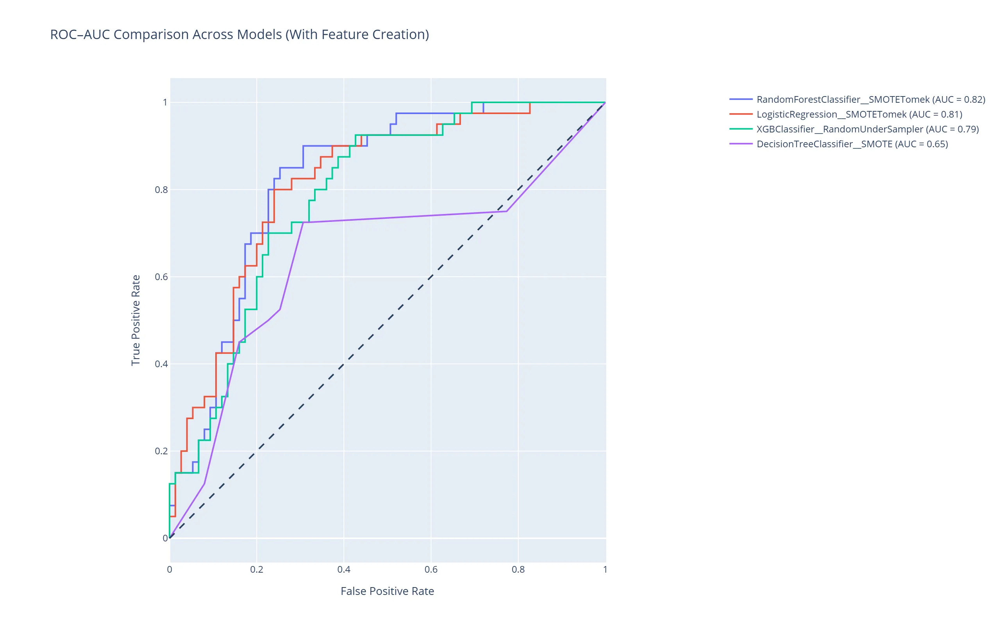

In [37]:
fig_wf, all_roc_data_wf, all_confusion_matrix_wf = build_roc_and_confusion_artifacts(
    trained_models_wf,
    X_eval,
    y_eval_encoded,
    fig_title="ROC–AUC Comparison Across Models (With Feature Creation)",
)

show_plot(fig_wf)


### 4.3.7.1 Get the best two model pipelines


In [38]:
def get_model_by_rank(
    rank: int,
    best_models_metrics: pd.DataFrame,
    best_models: Dict[str, Pipeline],
    metric: str
) -> tuple[Any, str, pd.Series]:
    """
    Get the model and its metrics by rank for a specified metric.
    
    Args:
        rank: 1-based rank (1 = best)
        best_models_metrics: DataFrame with metrics, index = model names
        best_models: dict mapping model names to trained model objects
        metric: metric column name to rank by
        
    Returns:
        model object, model name, metrics row (Series)
    """
    # Sort descending by metric
    sorted_metrics = best_models_metrics.sort_values(metric, ascending=False)
    
    # Get the row corresponding to the given rank
    rank_model_metric = sorted_metrics.iloc[rank - 1]
    rank_model_name = rank_model_metric.model_name

    normalized = {
        k.split("__", 1)[0]: v
        for k, v in best_models.items()
    }
    
    # Get the model object
    model = normalized.get(rank_model_name)
    
    return model, rank_model_name, rank_model_metric


In [39]:
best_model, best_model_name, best_model_metric = get_model_by_rank(1, model_metrics_wf, trained_models_wf, METRIC)
best_model

,steps,"[('feature_creator', ...), ('preprocessor', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,col_map,"{'blood_pressure': 'mean', 'bmi': 'median', 'glucose': 'median', 'insulin': 'median', ...}"
,drop_cols,"['insulin', 'skin_thickness']"
,create_bins,True
,create_interactions,True
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3


In [40]:
# Display the best model
print(f"The best model is: {best_model_name}")

The best model is: XGBClassifier


In [41]:
second_best_model, second_best_model_name, second_best_model_metric  = get_model_by_rank(2, model_metrics_wf, trained_models_wf, METRIC)
second_best_model

,steps,"[('feature_creator', ...), ('preprocessor', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,col_map,"{'blood_pressure': 'mean', 'bmi': 'median', 'glucose': 'median', 'insulin': 'median', ...}"
,drop_cols,"['insulin', 'skin_thickness']"
,create_bins,True
,create_interactions,True
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3


In [42]:
# Display the second best model
print(f"The second best model is: {second_best_model_name}")

The second best model is: RandomForestClassifier


### 4.3.7.3 Feature importances of the best model


In [43]:
def get_selected_feature_names(pipeline:Pipeline) -> np.ndarray:
    preprocessor = pipeline.named_steps["preprocessor"]
    selector = pipeline.named_steps["feature_selector"]

    feature_names = preprocessor.get_feature_names_out()
    return selector.get_feature_names_out(input_features=feature_names)


In [44]:
def get_feature_importances(model, feature_names):
    """
    Extract feature importances from any sklearn-compatible model.
    Supports tree models, linear models, and pipelines.
    """
    # If model is a pipeline, get the classifier
    if hasattr(model, "named_steps"):
        model = model.named_steps.get("classifier", model)

    # XGBoost / LightGBM / RandomForest / DecisionTree
    if hasattr(model, "feature_importances_"):
        return pd.Series(model.feature_importances_, index=feature_names)

    # Logistic Regression (coefficients)
    if hasattr(model, "coef_"):
        return pd.Series(np.abs(model.coef_[0]), index=feature_names)

    # Fallback: all zeros
    return pd.Series(np.zeros(len(feature_names)), index=feature_names)


In [45]:
def plot_feature_importance_heatmap(model: Pipeline, title: str="Feature Importance Heatmap"):
    
    feature_names = get_selected_feature_names(model)
    importances = get_feature_importances(model, feature_names)

    # Normalize for heatmap readability
    norm_importances = importances / importances.max()

    df = pd.DataFrame({
        "feature": feature_names,
        "importance": norm_importances
    }).sort_values("importance", ascending=False)

    fig = px.imshow(
        [df["importance"].values],
        labels=dict(x="Feature", y="", color="Importance"),
        x=df["feature"],
        y=[""],
        color_continuous_scale="Reds",
        text_auto=".3f",
        aspect="auto",
        title=title
    )

    fig.update_layout(
        height=600,
        xaxis_tickangle=45,
        template="plotly_white"
    )

    return fig


In [46]:
trained_models_wf.keys()

dict_keys(['LogisticRegression__SMOTETomek', 'RandomForestClassifier__SMOTETomek', 'DecisionTreeClassifier__SMOTE', 'XGBClassifier__RandomUnderSampler'])

In [47]:
trained_models.keys()

dict_keys(['LogisticRegression__RandomOverSampler', 'RandomForestClassifier__SMOTE', 'DecisionTreeClassifier__none', 'XGBClassifier__none'])

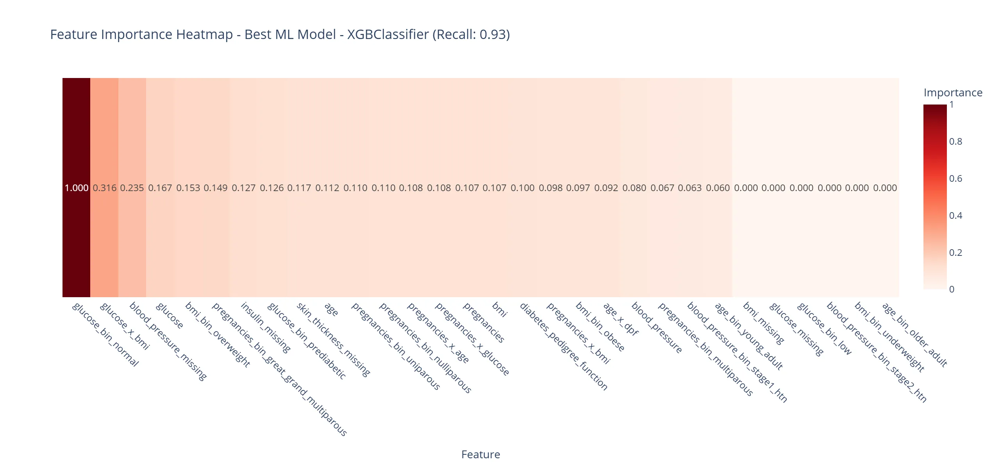

In [48]:
fig = plot_feature_importance_heatmap(best_model)
fig.update_layout(
    title=f"Feature Importance Heatmap - Best ML Model - {best_model_name} (Recall: {best_model_metric.recall:.2f})",
)

show_plot(fig)


In [49]:
def display_feature_importances(pipeline: Union[Pipeline, imPipeline], recall: str):
    # Get the feature names after transformation
    feature_columns = get_selected_feature_names(pipeline)

    importances_scores = pipeline.named_steps['classifier'].coef_.ravel()  if hasattr(pipeline.named_steps['classifier'], 'coef_') else pipeline.named_steps['classifier'].feature_importances_ 

    importances_df = pd.DataFrame({'feature': feature_columns, 'score': importances_scores})

    # Magnitude of impact
    importances_df.sort_values(by="score", ascending=True, inplace=True)

    # Create a horizontal bar chart using Plotly Express
    fig = px.bar(
        importances_df,
        x='score',
        y='feature',
        text_auto=True,
        orientation='h',  # Set orientation to horizontal
        title=f"Feature Importances- {pipeline['classifier'].__class__.__name__} (Recall Score positive class: {recall})",
        labels={'Score': 'Score', 'Feature': 'feature'},
        height=700,
        color='score',
        color_continuous_scale='Reds',
    )

    fig.update_traces(
        texttemplate='%{x:.3f}',  # rounds x-values to 3 decimals
        textposition='auto'
    )

    return fig

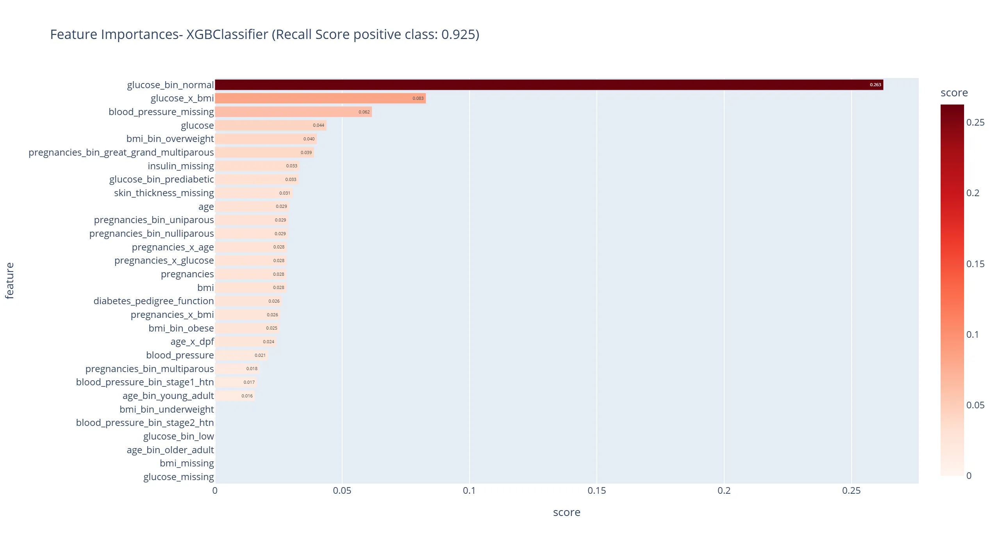

In [50]:
show_plot(display_feature_importances(best_model, recall=str(best_model_metric.recall)))

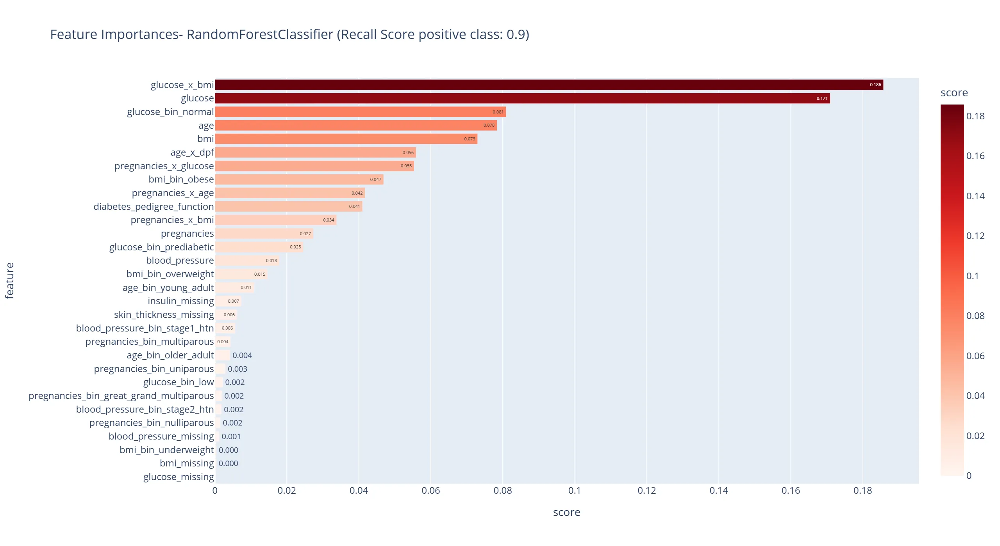

In [51]:
show_plot(display_feature_importances(second_best_model, recall=second_best_model_metric.recall))

# SHAP VALUES

In [52]:
def feat_create_transform(
    df: pd.DataFrame,
    pipeline: Pipeline,
    feat_step: str = 'feature_creator',
    preprocessor_step: str = 'preprocessor',
    selector_step: Optional[str] = 'feature_selector'
) -> pd.DataFrame:
    """
    Apply feature creation, preprocessing, and optional feature selection
    to a DataFrame, returning a transformed DataFrame with correct feature names.

    Parameters
    ----------
    df : pd.DataFrame
        Input raw data.
    pipeline : Pipeline
        Full pipeline containing feature_creator, preprocessor, and optional feature_selector.
    feat_step : str
        Name of feature creation step.
    preprocessor_step : str
        Name of preprocessing step.
    selector_step : str, optional
        Name of feature selection step (default: 'feature_selector').

    Returns
    -------
    pd.DataFrame
        Transformed DataFrame with feature names aligned to output.
    """

    X_trans = df.copy()

    # --- Step 1: Feature creation ---
    if feat_step in pipeline.named_steps:
        X_trans = pipeline.named_steps[feat_step].transform(X_trans)

    # --- Step 2: Preprocessing ---
    preprocessor = pipeline.named_steps[preprocessor_step]
    X_trans = preprocessor.transform(X_trans)
    feature_names = preprocessor.get_feature_names_out()
    X_trans = pd.DataFrame(X_trans, columns=feature_names, index=df.index)

    # --- Step 3: Feature selection ---
    if selector_step and selector_step in pipeline.named_steps:
        feature_names = get_selected_feature_names(pipeline)
        X_trans = X_trans[list(feature_names)]

    return X_trans


In [53]:
trained_models_wf.keys()

dict_keys(['LogisticRegression__SMOTETomek', 'RandomForestClassifier__SMOTETomek', 'DecisionTreeClassifier__SMOTE', 'XGBClassifier__RandomUnderSampler'])

In [54]:
# --- Define categories for auto-detection ---
TREE_MODELS: List[Type] = [
    DecisionTreeClassifier,
    XGBClassifier,
    RandomForestClassifier, 
]

LINEAR_MODELS: List[Type] = [
    LogisticRegression,
]

# NEURAL_MODELS: List[Type] = [
#     KerasModel, nn.Module
# ]

# Union of all ML model types for type hints
MLModelType = Union[BaseEstimator] # KerasModel, nn.Module]

def get_shap_plot_df(
    pipeline: Pipeline,
    X_train: pd.DataFrame,
    X_test: pd.DataFrame,
    model_type: str = "auto",
    add_feature_values: bool = True
) -> Tuple[pd.DataFrame, np.ndarray, List[str]]:
    """
    Compute SHAP values for a fitted ML pipeline and return a long-form DataFrame for plotting.
    
    Returns:
        df_plot: long-form DataFrame with columns ["Feature", "SHAP", "predictions", "Feature_Value" (optional)]
        shap_values: np.ndarray of SHAP values
        feature_order: List of features sorted by importance (range of SHAP)
    """

    # Step 0: Extract classifier
    model: MLModelType = pipeline.named_steps['classifier']

    # Step 1: Transform features through the full pipeline
    X_train_transformed = feat_create_transform(X_train, pipeline)
    X_test_transformed = feat_create_transform(X_test, pipeline)

    # Step 2: Auto-detect model type if needed
    if model_type == "auto":
        if any(isinstance(model, m) for m in TREE_MODELS):
            model_type = "tree"
        elif any(isinstance(model, m) for m in LINEAR_MODELS):
            model_type = "linear"
        else:
            model_type = "neaural"

    # Step 3: Compute SHAP values
    if model_type == "tree" or model_type == "linear":
        explainer = shap.Explainer(model.predict, X_train_transformed)
        shap_values = explainer(X_test_transformed).values
    elif model_type == "neural":
        explainer = shap.DeepExplainer(model, X_train_transformed)
        shap_values = explainer.shap_values(X_test_transformed)
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # --- Step 4: Build long-form DataFrame ---
    shap_df = pd.DataFrame(
        shap_values,
        columns=X_test_transformed.columns,
        index=X_test_transformed.index
    )
    shap_df["predictions"] = pipeline.predict(X_test) if hasattr(model, "predict") else np.nan

    df_plot = pd.melt(
        shap_df,
        id_vars=["predictions"],
        value_vars=X_test_transformed.columns,
        var_name="Feature",
        value_name="SHAP"
    )

    # --- Step 5: Sort features by SHAP range (importance) ---
    feature_order = (
        df_plot.groupby('Feature')['SHAP']
        .agg(lambda x: x.max() - x.min())
        .sort_values(ascending=True)
        .index.tolist()
    )
    df_plot['Feature'] = pd.Categorical(df_plot['Feature'], categories=feature_order, ordered=True)

    # --- Step 6: Add original feature values for hover info ---
    if add_feature_values:
        X_long = pd.melt(
            X_test.reset_index(drop=True),
            var_name="Feature",
            value_name="Feature_Value"
        )
        df_plot["Feature_Value"] = X_long["Feature_Value"]

    return df_plot, shap_values, feature_order




In [ ]:
df_plot, shap_values, feature_order = get_shap_plot_df(
    pipeline=best_model,
    X_train=X_train,
    X_test=X_eval,
)
df_plot.head()

PermutationExplainer explainer: 116it [01:05,  1.77it/s]                         


,predictions,Feature,SHAP,Feature_Value
0,0,pregnancies,0.00,4.00
1,0,pregnancies,0.00,0.00
2,0,pregnancies,-0.00,4.00
3,1,pregnancies,0.01,0.00
4,1,pregnancies,0.01,0.00


In [56]:
def plot_shap_values(df_plot: pd.DataFrame, feature_order: List, target_label: str)-> go.Figure:

    fig = px.strip(
        df_plot, 
        x='SHAP', 
        y='Feature', 
        color='predictions', 
        stripmode='overlay', 
        height=max(800, df_plot["Feature"].nunique() * 40), 
        color_discrete_sequence=[COLOR_DISCRETE_SEQUENCE[1],COLOR_DISCRETE_SEQUENCE[0]],
        # width=1000,
        title="SHAP Value Distribution per Feature (Strip)",
    )
    
    fig.update_layout(
        xaxis=dict(
            title="SHAP Value (Impact on Model Output)",
            showgrid=True, 
            gridcolor='WhiteSmoke', 
            zerolinecolor='Gainsboro'
        ),
        yaxis=dict(
            title="Feature",
            showgrid=True, 
            gridcolor='WhiteSmoke', 
            zerolinecolor='Gainsboro'
        )
    )
    
    # fig.update_layout(plot_bgcolor='white')

    fig = (
        fig
        # Make it so there is no gap between the supporting boxes
        .update_layout(boxgap=0)
        # Increase the jitter so it reaches the sides of the boxes
        .update_traces(jitter=1)
    )
    
    # Fix x-axis range
    # fig.update_xaxes(range=[-2.5, 2.5])
    
    # Legend
    fig.update_layout(
        showlegend=True,
        legend=dict(
            title=target_label,
            orientation="v",  # 'h' for horizontal
            x=1,
            y=1
        ),
        xaxis=dict(showgrid=True, gridcolor='WhiteSmoke', zerolinecolor='Gainsboro'),
        yaxis=dict(showgrid=True, gridcolor='WhiteSmoke', zerolinecolor='Gainsboro')
    )
    
    # Force Plotly to honor the categorical order
    fig.update_yaxes(categoryorder='array', categoryarray=feature_order)

    return fig

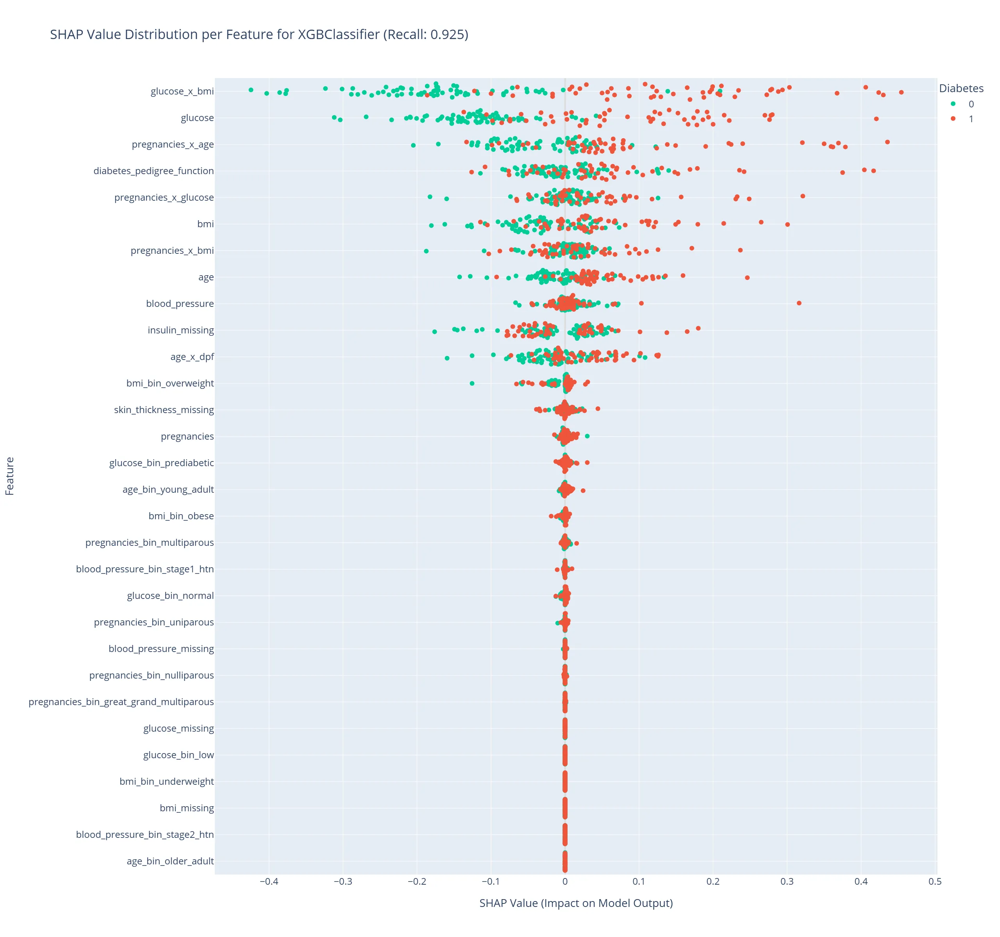

In [57]:
fig = plot_shap_values(df_plot, feature_order, 'Diabetes')
fig.update_layout(title=f"SHAP Value Distribution per Feature for {best_model_name} (Recall: {best_model_metric.recall:.3f})")
show_plot(fig)

In [ ]:
df_plot, shap_values, feature_order = get_shap_plot_df(
    pipeline=second_best_model,
    X_train=X_train,
    X_test=X_eval,
)
df_plot.head()

PermutationExplainer explainer: 116it [02:47,  1.61s/it]                         


,predictions,Feature,SHAP,Feature_Value
0,0,pregnancies,-0.01,4.00
1,0,pregnancies,-0.01,0.00
2,1,pregnancies,-0.00,4.00
3,1,pregnancies,-0.01,0.00
4,1,pregnancies,-0.01,0.00


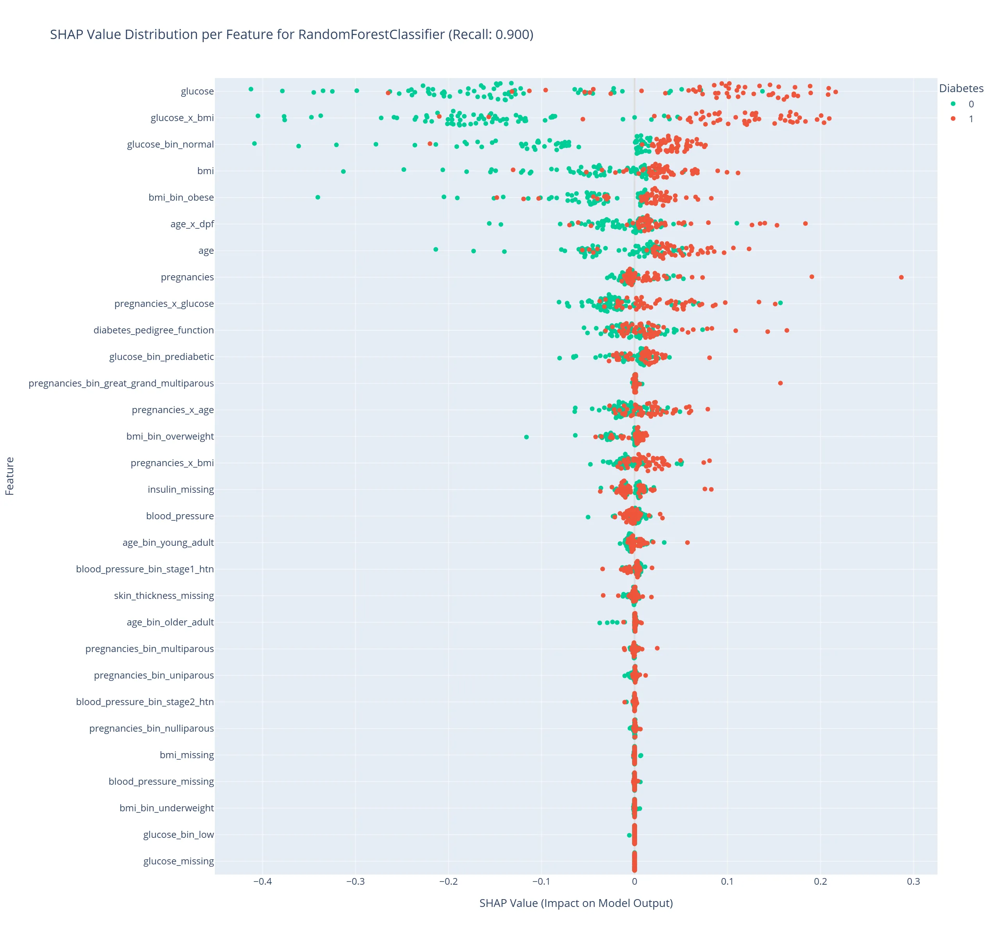

In [59]:
fig = plot_shap_values(df_plot, feature_order, 'Diabetes')
fig.update_layout(title=f"SHAP Value Distribution per Feature for {second_best_model_name} (Recall: {second_best_model_metric.recall:.3f})")
show_plot(fig)


## **🔷 Key Insight**

**Feature‑engineered machine learning models deliver a substantial and clinically meaningful improvement in sensitivity—raising recall from 0.85–0.90 (without feature creation) to 0.90–0.93 (with feature creation).**  
This uplift confirms that structured feature creation unlocks latent physiological signal that raw models fail to capture, especially in tabular clinical data where nonlinear interactions drive disease risk.

The strongest performance came from **XGBoost with feature creation (recall = 0.93)**, followed closely by **Random Forests (recall = 0.90)**. These results reinforce a consistent pattern in clinical ML literature: **tree‑based ensemble models benefit disproportionately from interaction terms, binning, and missingness indicators**, enabling them to model metabolic and demographic risk factors with greater fidelity.

Across all models, feature creation improved recall **without degrading discrimination**, demonstrating that engineered features enhance the model’s ability to capture clinically relevant relationships such as glucose×BMI, age×DPF, and pregnancies×glucose—variables strongly associated with diabetes progression in epidemiological studies.

---

## **🔷 Why This Matters Clinically**

#### **1. High recall is the primary clinical objective in diabetes screening**  
In screening contexts, the ethical and clinical priority is to **minimize false negatives**. Missing a high‑risk patient delays intervention and increases the likelihood of neuropathy, retinopathy, cardiovascular disease, and long‑term metabolic deterioration.

Results show:

- **Without feature creation:** recall = 0.85–0.90  
- **With feature creation:** recall = 0.90–0.93  

These values exceed or match the sensitivity of established screening tools. For example:

- **The ADA Prediabetes Risk Test** demonstrated a sensitivity of **78.9%** in a Saudi cohort (Aldayel et al., 2021), meaning the best models outperform widely used clinical screening instruments.

The models are **clinically viable triage tools** capable of identifying high‑risk individuals earlier and more reliably.
They are also capable for embedding in **clincial decision support systems.**

---

#### **2. Feature engineering captures clinically meaningful interactions**  
The improvement in recall is driven by engineered features that reflect real physiological and demographic relationships:

- **glucose × BMI** → metabolic load and insulin resistance  
- **age × DPF** → hereditary risk modulated by age  
- **pregnancies × glucose** → gestational diabetes risk patterns  
- **missingness indicators** → clinically meaningful absence of measurements  

---

#### **3. Ensemble models remain the most clinically reliable**  
The results reinforce a well‑documented trend:

- **XGBoost** achieved the highest recall (0.93)  
- **Random Forests** followed closely (0.90)  
- **Logistic Regression** remained stable and interpretable (0.80–0.88)  
- **Decision Trees** improved but remained the least stable  

Tree‑based ensembles excel in clinical tabular data because they:

- model nonlinear interactions natively  
- handle missingness and skewed distributions  
- remain robust under resampling  
- generalize well on small‑to‑medium datasets  

This makes them strong candidates for real‑world clinical decision support.

---

## **🔷 Summary**

> **Feature creation elevates the ML system from “clinically promising” to “clinically deployable.”**  
> With recall reaching **0.93**, the XGBoost model with engineered features surpasses the sensitivity of established diabetes screening tools and provides a defensible foundation for clinical decision support—provided that calibration, threshold governance, and subgroup fairness checks are maintained.

---

## **References**

Aldayel, F. A., Belal, M. A., Alsheikh, A. M., Aldayel, F., & Belal, M. (2021). *The validity of the American Diabetes Association’s diabetes risk test in a Saudi Arabian population.* Cureus, 13(9).



### 4.5 Persist the models 💾

#### 4.5.1 Using Joblib

In [111]:
def save_models_and_pipelines(
    best_models: Dict[str, Pipeline],
    label_encoder: LabelEncoder,
    feature_creator_pipeline: Pipeline,
    preprocessor_pipeline: Pipeline,
    save_models_dir: str,
    path_maker: callable
) -> None:
    """
    Save trained models, label encoder, feature creation pipeline, and preprocessor pipeline to disk.

    Args:
        best_models (Dict[str, Pipeline]): Dictionary of model name → trained pipeline.
        label_encoder (LabelEncoder): Trained label encoder.
        feature_creator_pipeline (Pipeline): Feature creation pipeline.
        preprocessor_pipeline (Pipeline): Preprocessing pipeline.
        save_models_dir (str): Base directory where everything will be saved.
        path_maker (callable): Function that returns full Path and creates directories if needed.
    """

    # --- Save trained models ---
    for model_name, pipeline in best_models.items():
        model_path = path_maker(f"{model_name}.joblib", save_models_dir)
        joblib.dump(pipeline, model_path)

    # --- Save feature creation pipeline ---
    fc_path = path_maker("feature_creator.joblib",save_models_dir)
    joblib.dump(feature_creator_pipeline, fc_path)

    # --- Save preprocessor pipeline ---
    pre_path = path_maker("preprocessor.joblib", save_models_dir)
    joblib.dump(preprocessor_pipeline, pre_path)

    # --- Save label encoder ---
    enc_path = path_maker("label_encoder.joblib", save_models_dir)
    joblib.dump(label_encoder, enc_path)

    print("💾 All models, feature creator, preprocessor, and label encoder have been saved successfully.")


In [109]:
ml_save_dir = SAVE_MODELS / 'ml'

save_models_and_pipelines(
    trained_models_wf,
    label_encoder,
    best_model.named_steps["feature_creator"], # fitted
    best_model.named_steps["preprocessor"], # fitted
    ml_save_dir,
    path_maker
)

💾 All models, feature creator, preprocessor, and label encoder have been saved successfully.


### 4.5.2. Saving the threshold for the best model

- json

In [95]:
THRESHOLD_FILENAME = "ml_threshold.json"
THRESHOLD_PATH = path_maker(filename=THRESHOLD_FILENAME, path= BASE_DIR / "artifacts" / "ml")

with open(THRESHOLD_PATH, "w") as f:
    json.dump({"threshold": float(best_model_metric.threshold)}, f, indent=4)

print(f"Best model {best_model_metric.model_name} threshold saved to {THRESHOLD_PATH}")   

Best model XGBClassifier threshold saved to ..\artifacts\ml\ml_threshold.json


### 4.5.3 Saving the SHAP backround for the best model

In [102]:
def create_and_save_shap_background(
    X_train_fc: pd.DataFrame,
    preprocessor: Pipeline,
    background_size: int = 300,
    bg_dir: Path = '',
    filename: str = "shap_background.joblib",
    random_state: int = 2026
) -> np.ndarray:
    """
    Creates a SHAP background dataset by:
    1. Sampling a subset of the feature-created training data
    2. Preprocessing it using the frozen preprocessor
    3. Saving the preprocessed background to disk

    Parameters
    ----------
    X_train_fc : pd.DataFrame or np.ndarray
        Feature-created training data (before preprocessing).
    preprocessor : fitted sklearn transformer
        The frozen preprocessor used for the model.
    background_size : int
        Number of samples to include in the SHAP background.
    bg_dir: Path
        The directory where background is saved
    filename : str
        Output filename for the saved background.
    random_state : int
        Seed for reproducible sampling.

    Returns
    -------
    np.ndarray
        The preprocessed SHAP background matrix.
    """

    # 1. Sample a representative subset
    if len(X_train_fc) > background_size:
        X_bg = resample(
            X_train_fc,
            n_samples=background_size,
            replace=False,
            random_state=random_state,
        )
    else:
        X_bg = X_train_fc.copy()

    # 2. Preprocess the background
    X_bg_proc = preprocessor.transform(X_bg).astype("float32")

    # 3. Save to disk
    bg_path = path_maker(filename, bg_dir)
    joblib.dump(X_bg_proc, bg_path)

    print(f"SHAP background saved to: {bg_path}")
    print(f"Background shape: {X_bg_proc.shape}")

    return X_bg_proc


In [103]:
background = create_and_save_shap_background(
    X_train_fc=best_model.named_steps['feature_creator'].transform(X_train),
    preprocessor=best_model.named_steps['preprocessor'],
    background_size=300,
    bg_dir=BASE_DIR / "artifacts" / "ml",
    filename="shap_background.joblib"
)


SHAP background saved to: ..\artifacts\ml\shap_background.joblib
Background shape: (300, 30)


Made with 💖 [Gabriel Okundaye](https://www.linkedin.com/in/dr-gabriel-okundaye)
<span style="color: #aaaaaa;">& Light ✨</span>